# CLUSTER ANALYSIS OF TISSUE DATASETS FILTERED BY CLOCKS

# Approach:
To understand how the clock is affected by the type of tissue, we will perform cluster analysis using the tissue-specific datasets filtered from the full methylation dataset. We will use and compare several clustering algorithms (K-Mean, Hierarchical clustering and DBSCANN) to group the tissues based on the methylation levels of the CpG sites. We will then analyze the clusters to identify the tissues that have similar methylation patterns and identify CpG sites that are differentially methylated between the clusters.

# Goal
Measuring the similarity between tissues based on the methylation levels of the CpG sites can help us understand how the clock is affected by the type of tissue. By identifying tissues with similar methylation patterns, we can gain insights into the underlying biological processes that drive the aging process in different tissues.

STEPS:
- Feature Selection: Use the clock dataset to select the top CpGs identified by the clocks to be informative for age prediction. These CpGs will serve as features for clustering.
- Clustering: Apply a clustering algorithm to each tissue-specific dataset separately using the selected CpGs as features. 
- Cluster Analysis: Analyze the clusters to identify tissues with similar methylation patterns and CpGs that are differentially methylated between the clusters.
- Validation: Validate the stability and reproducibility of the clusters using appropriate methods such as bootstrapping or cross-validation.

NOTES:
Finding the best K: The K-means algorithm requires the number of clusters (K) to be specified in advance. To determine the optimal number of clusters, we will use the elbow method, silhouette score, and gap statistic. The best measure of K is the silhouette score, which is a measure of how similar an object is to its own cluster compared to other clusters. The silhouette score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

## 0. Load data and filter datasets by clocks (Clock 2)

In [1]:
#### LOAD: libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns

import itertools
from itertools import combinations

from pathlib import Path

import matplotlib.cm as cm  
from matplotlib import colormaps as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, jaccard_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score, pairwise_distances
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances

from scipy.spatial.distance import euclidean, pdist, squareform
from scipy.cluster.hierarchy import single, cophenet, linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist, cityblock, squareform, euclidean
from scipy.stats import f_oneway


from dask.distributed import Client
import dask.dataframe as dd
import dask.array as da
from dask import delayed, compute
from dask.distributed import Client, progress, LocalCluster
from dask.diagnostics import ProgressBar

import joblib


In [2]:
#### LOAD: Functions

###############################################

def kmeans_clustering(X, k):

    """
    Perform k-means clustering on a dataset. Also calculates silhouette score and inertia. 
    Plot the elbow plot to determine the optimal number of clusters.

    Parameters:
    - X: Dataset to cluster.
    - k: Number of clusters to create.

    """

    try:
        # Initialize k-means clustering with current parameters
        kmeans = KMeans(n_clusters=k, random_state=42)
        
        # Fit the model to the data
        kmeans.fit(X)
        
        # Calculate silhouette score to evaluate the clustering
        silhouette_avg = silhouette_score(X, kmeans.labels_)
        
        # Get inertia (sum of squared distances to the closest cluster center)
        inertia = kmeans.inertia_
        
        return [k, silhouette_avg, kmeans.cluster_centers_, kmeans.labels_, inertia]
    except Exception as e:
        return [k, None, None, None, None, str(e)]
    

###############################################

def hierarchical_clustering(X, method, metric):

    """
    Perform hierarchical clustering on a dataset. Also calculates cophenetic correlation and silhouette score.

    Parameters:
    - X: Dataset to cluster.
    - method: Linkage method to use.
    - metric: Distance metric to use.
    
    """

    try:
        # Perform hierarchical clustering
        Z = linkage(X, method=method, metric=metric)

        # Calculate the cophenetic correlation
        c, coph_dists = cophenet(Z, pdist(X))

        # Calculate the silhouette score
        labels = fcluster(Z, t=0.7 * np.max(Z[:, 2]), criterion='distance')  # Using distance criterion
        silhouette_avg = silhouette_score(X, labels)

        return ['Complete', method, metric, c, silhouette_avg, Z, labels]
    except ValueError as e:
        return ['Complete', method, metric, None, None, None, str(e)]

###############################################

# Add DBSCAN HERE

###############################################

def feature_analysis(tissue_name, dataset, labels):
    """
    Perform feature analysis on a dataset using different statistical tests.
    
    Args:
        tissue_name (str): Name of the tissue.
        dataset (pd.DataFrame): Dataset with CpGs as columns and samples as rows.
        labels (np.array): Cluster labels for each sample.
        
    Returns:
        pd.DataFrame: Feature scores and p-values for each statistical test.
    """
    
    # Convert dataset to numpy array
    X = dataset.values
    
    # Chi-squared test
    chi2_scores, chi2_pvalues = chi2(X, labels)
    
    # ANOVA F-value
    f_scores, f_pvalues = f_classif(X, labels)
    
    # Mutual Information
    mi_scores = mutual_info_classif(X, labels)
    
    # Create a dataframe with feature scores and p-values
    feature_scores = pd.DataFrame({
        'CpG': dataset.columns,
        'Chi2_Score': chi2_scores,
        'Chi2_Pvalue': chi2_pvalues,
        'F_Score': f_scores,
        'F_Pvalue': f_pvalues,
        'MI_Score': mi_scores
    })
    
    # Sort the dataframe by Chi2 score in descending order
    feature_scores = feature_scores.sort_values(by='Chi2_Score', ascending=False)
    
    return feature_scores



In [3]:
#### LOAD: Metadata
metadata = pd.read_csv('GSE223748_complete_metadata.csv')

In [4]:
#### LOAD: Complete methylation data

complete_methylation = pd.read_csv('GSE223748_datBetaNormalized.csv')
complete_methylation.rename(columns={'Unnamed: 0': 'CpG'}, inplace=True)

In [5]:
#### LOAD: Tissue-specific methylation datasets from the saved CSV files

folder_name = "Tissue Methylation"
tissue_files = os.listdir(folder_name) # Get a list of all files in the folder
tissues_df = metadata[['Sample', 'Tissue']]
tissues = tissues_df['Tissue'].unique() # Get a list of all tissues

# Load each CSV file into its own dataframe
for file in tissue_files:
    if file.endswith("_methylation_dataset.csv"):
        # Extract tissue name from file name
        tissue = file.split("_")[0]

        # Load CSV file into dataframe
        file_path = os.path.join(folder_name, file)
        globals()['{}_methylation_dataset'.format(tissue)] = pd.read_csv(file_path)

In [6]:
#### LOAD: Methylation data for the complete CpGs of each clock
# clock2 = pd.read_csv('./Clocks Methylation Data/Clokc2_Methylation_data_complete.csv')
clock2 = pd.read_csv('./Clocks Methylation Data/Clock2_Methylation_data_complete.csv')
# clock3 = pd.read_csv('./Clocks Methylation Data/Clock3_Methylation_data_complete.csv')
# clock2_3 = pd.read_csv('./Clocks Methylation Data/Clock2_3_Overlap_Methylation_data_complete.csv')

In [7]:
clock2.shape ### Clock

(816, 15044)

In [8]:
clock2.head() ### Clock

,CpG,202897220093_R01C01,202897220093_R02C01,202897220093_R03C01,202897220093_R04C01,202897220093_R05C01,202897220093_R06C01,202897220093_R01C02,202897220093_R02C02,202897220093_R03C02,...,206139140103_R02C02,206139140103_R03C02,206139140103_R04C02,206139140103_R05C02,206139140103_R06C02,206139140104_R01C01,206139140104_R02C01,206139140104_R03C01,206139140104_R04C01,206139140104_R05C01
0,cg05474883,0.912788,0.917133,0.913420,0.921562,0.914849,0.914164,0.920831,0.922740,0.920609,...,0.949819,0.955801,0.963495,0.965418,0.958327,0.962063,0.961395,0.961078,0.964133,0.964971
1,cg09710440,0.073836,0.075940,0.077805,0.075718,0.073214,0.075399,0.071843,0.070077,0.079597,...,0.108759,0.114258,0.109115,0.112616,0.122235,0.123950,0.111572,0.107696,0.111466,0.104929
2,cg26512254,0.058776,0.059387,0.055818,0.055760,0.059448,0.051183,0.052774,0.052717,0.056062,...,0.056554,0.066007,0.055089,0.057348,0.043232,0.053983,0.058618,0.056969,0.060566,0.056158
3,cg08681110,0.020429,0.017515,0.017613,0.020568,0.018586,0.021108,0.021225,0.018911,0.020279,...,0.015058,0.015009,0.014451,0.014201,0.016092,0.014808,0.014802,0.013939,0.013984,0.013123
4,cg09227056,0.135012,0.130197,0.124529,0.103617,0.104707,0.098344,0.104120,0.127767,0.119270,...,0.144678,0.113879,0.130000,0.118300,0.120283,0.114300,0.140468,0.140113,0.141410,0.150231


In [9]:
#### Filter the complete methylation dataset by the CpGs in Clock2
clock2_cpgs = clock2['CpG'].values ### Clock
complete_methylation_dataset_clock2_filtered = complete_methylation[complete_methylation['CpG'].isin(clock2_cpgs)] ### Clock
complete_methylation_dataset_clock2_filtered.shape ### Clock

(816, 15044)

In [10]:
#### Filter the all tissues-specific datasets by the CpGs in clock 2
clock2_cpgs = clock2['CpG'].values ### Clock

for tissue in tissues:
    tissue_df = globals()['{}_methylation_dataset'.format(tissue)].copy()
    tissue_df = tissue_df[tissue_df['CpG'].isin(clock2_cpgs)] ### Clock
    globals()['{}_methylation_dataset_clock2_filtered'.format(tissue)] = tissue_df

# Note to self: the resulting variables will be named as follows: Blood_methylation_dataset_clock2_filtered

In [11]:
# Create a dataframe with the tissue names and respective filtered datasets

# List with tissue datasets
tissues = tissues_df['Tissue'].unique() # Get a list of all tissues
tissue_datasets = pd.DataFrame(columns=['Tissue', 'Dataset']) # create a dataframe to store the datasets

# List of tissues not included
tissues_not_included = []

# fill the dictionary with dataset and respective tissue name
for tissue in tissues:

    # Check that the tissue has more than 10 samples
    if metadata[metadata['Tissue'] == tissue].shape[0] < 10:
        # add tissue name to not included list
        tissues_not_included.append(tissue)
        # print(f'{tissue} has less than 10 samples and will not be included.')
    else:
        tissue_datasets.loc[len(tissue_datasets)] = [tissue, globals()['{}_methylation_dataset_clock2_filtered'.format(tissue)]] ### Clock
print('Tissues not included:', tissues_not_included)
print('Total number of tissues not included:', len(tissues_not_included))
tissue_datasets.head()

Tissues not included: ['Testis', 'Pancreas', 'Thyroid', 'Blubber', 'Ileum', 'Duodenum', 'Tendon', 'Mammary', 'TemporalCortex', 'Lamina', 'OccipitalCortex', 'ParietalCortex', 'MitralValve', 'AdrenalCortex', 'Sacrocaudalis', 'Cecum', 'Uterus', 'Jejunum', 'Larynx', 'SpinalCord', 'Suspensory', 'Cartilage', 'Astrocyte', 'Epidermis', 'Dermis', 'Maybe.Larynx']
Total number of tissues not included: 26


,Tissue,Dataset
0,Cortex,CpG 202794570001_R01C01 202794...
1,Liver,CpG 202794570002_R01C01 202794...
2,Blood,CpG 202794570002_R01C02 202794...
3,Skin,CpG 202794570010_R01C01 202794...
4,Muscle,CpG 202894750009_R02C02 202894...


Tissues with less than 10 samples were removed from the analysis.

In [12]:
# Summary of the tissues used in the analysis
print('clock 2 DATA SUMMARY') ### Clock
print('Total number of tissues:', len(tissues))
print('Number of tissues included:', tissue_datasets.shape[0])
print('Number of tissues not included:', len(tissues_not_included))
print('Tissues included not included:', tissues_not_included)


clock 2 DATA SUMMARY
Total number of tissues: 70
Number of tissues included: 44
Number of tissues not included: 26
Tissues included not included: ['Testis', 'Pancreas', 'Thyroid', 'Blubber', 'Ileum', 'Duodenum', 'Tendon', 'Mammary', 'TemporalCortex', 'Lamina', 'OccipitalCortex', 'ParietalCortex', 'MitralValve', 'AdrenalCortex', 'Sacrocaudalis', 'Cecum', 'Uterus', 'Jejunum', 'Larynx', 'SpinalCord', 'Suspensory', 'Cartilage', 'Astrocyte', 'Epidermis', 'Dermis', 'Maybe.Larynx']


In [13]:
### Clustermaps of Tissue Datasets

# Create a folder to save the results
folder = r'./Heatmap Scripts/Tissue heatmaps/Clokc2' ###Clock
os.makedirs(folder, exist_ok=True)

# Iterate over the tissue datasets and generate the heatmaps
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']
    
    # Transpose the dataset
    tissue_dataset_transposed = tissue_dataset.set_index('CpG').transpose()

    # Generate the heatmap
    clustermap = sns.clustermap(tissue_dataset_transposed, 
                                cmap='RdBu_r', 
                                metric='euclidean', 
                                row_cluster=True,
                                col_cluster=True,
                                z_score=None, 
                                standard_scale=None, 
                                figsize=(10, 8), 
                                vmin=0, vmax=1,  # Set the range of values for the colormap
                                cbar_kws={'label': 'CpGs\nBeta-value', 'orientation': 'vertical'})

    # Adjust the colorbar
    clustermap.cax.set_position([.85, .7, .03, .45])  # [left, bottom, width, height] - thinner and top right
    clustermap.cax.set_aspect(2)  # Make the colorbar taller

    # Update axis labels
    clustermap.ax_heatmap.set_xlabel('CpG')
    clustermap.ax_heatmap.set_ylabel('Sample')

    # Add the title above the clustering lines
    clustermap.fig.suptitle(f'{tissue_name}', x=0.5, y=1.05, ha='center', fontsize=16, fontweight='bold')

    # plt.show()

    # Save the plot
    filepath = os.path.join(folder, f'{tissue_name}_clock2_heatmap.png') ###Clock
    try:
        clustermap.savefig(filepath)
        print(f"Saved heatmap for {tissue_name} at {filepath}")
        # if os.path.exists(filepath):
        #     print(f"File successfully created: {filepath}. Size: {os.path.getsize(filepath)} bytes")
        # else:
        #     print(f"Error: File not created at {filepath}")
    except Exception as e:
        print(f"Error saving heatmap for {tissue_name}: {str(e)}")

    # Close the plot to free up memory
    plt.close(clustermap.fig)


Saved heatmap for Cortex at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Cortex_clock2_heatmap.png
Saved heatmap for Liver at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Liver_clock2_heatmap.png
Saved heatmap for Blood at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Blood_clock2_heatmap.png
Saved heatmap for Skin at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Skin_clock2_heatmap.png
Saved heatmap for Muscle at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Muscle_clock2_heatmap.png
Saved heatmap for Fibroblast at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Fibroblast_clock2_heatmap.png
Saved heatmap for Striatum at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Striatum_clock2_heatmap.png
Saved heatmap for Kidney at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Kidney_clock2_heatmap.png
Saved heatmap for Spleen at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Spleen_clock2_heatmap.png
Saved heatmap for Lung at ./Heatmap Scripts/Tissue heatmaps/Clokc2\Lung_clock2_heatmap.png
Saved heatmap for LymphNode at ./Heatmap Scripts/T

## 1. K-MEANS clutering of CpGs from all tissue datasets filtered by clock2

### 1.1. K-Means Clustering of Full Methylation Dataset filtered by CpGs in clock 2

RUN THIS LATER IN JACKS PC

In [14]:
# #### [ RUN IN JACKS PC] Smaller dask chunks for faster computation (and prevent memory errors) 

# # Start a Dask client with a specific port
# client = Client(dashboard_address=':50129')

# # Select dataset
# df = complete_methylation_dataset_clock2_filtered ### Clock

# # Instantiate the results DataFrame
# km_results_complete = pd.DataFrame(columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia'])
# km_results_errors = pd.DataFrame(columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia', 'error'])

# # Transpose the dataset so that the samples are rows and CpGs are columns (CpGs as features)
# complete_dataset = df.set_index('CpG').transpose()

# # Select the data (the first not removed as samples are indexed and therefore dont count as a column)
# X = complete_dataset.iloc[:,:]

# # Convert to Dask array with smaller chunks
# X_dask = da.from_array(X, chunks=(50, X.shape[1]))

# # Scatter the data to workers and broadcast it so that all workers have access to it. Prevents memory errors. 
# X_dask_future = client.scatter(X_dask, broadcast=True)

# # Define the range of k values
# k_values = range(2, 85)

# # Create a list of delayed tasks for each k value
# tasks = [kmeans_clustering(X_dask_future, k) for k in k_values]

# # Use Dask's ProgressBar to track progress
# with ProgressBar():
#     print("Starting computation...")
#     # Compute the tasks in parallel
#     results = compute(*tasks)
#     print("Computation completed.")

# # Separate successful results from errors
# successful_results = [res for res in results if res[-1] is None] # Filter out errors
# error_results = [res for res in results if res[-1] is not None] # Filter out successful results

# # Convert results to DataFrame
# km_results_complete = pd.DataFrame(results, columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia'])

# # Convert error results to DataFrame
# km_results_errors = pd.DataFrame(results, columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia', 'error'])

# # Sort the results by silhouette score and display the top results
# km_results_complete_sorted = km_results_complete.sort_values(by='silhouette_score', ascending=False)

# # Save the cluster labels and centers of the top-performing model
# top_model = km_results_complete_sorted.iloc[0]
# top_k = top_model['k']
# top_silhouette_score = top_model['silhouette_score']
# top_cluster_centers = top_model['cluster_centers']
# top_labels = top_model['labels']

# # Save top results using joblib for future plotting
# folder = './Cluster Analysis/Clustering Results/Clock2/KM/COMPLETE DATASET' ### Clock
# os.makedirs(folder, exist_ok=True)

# centers_path = os.path.join(folder, f'top_cluster_centers_KM_results_complete_clock2.joblib') ### Clock
# joblib.dump(top_cluster_centers, centers_path)

# labels_path = os.path.join(folder, f'top_labels_KM_results_complete_clock2.joblib') ### Clock
# joblib.dump(top_labels, labels_path)

# # Plot the elbow plot
# plt.figure(figsize=(10, 6))
# plt.plot(km_results_complete['k'], km_results_complete['inertia'], 'bo-')
# plt.xlabel('Number of clusters, k')
# plt.ylabel('Inertia')
# plt.title('Elbow Plot for K-Means Clustering')
# plt.show()

# # Shut down the Dask client
# client.close()

# km_results_complete_sorted.head()

In [15]:
#### [RUN IN JACKS PC] Kmeans clustering of the complete methylation dataset - Smaller Chunks and Elbow plot

# # Start a Dask client
# client = Client() 
     
# # Select dataset
# df = complete_methylation_dataset_clock2_filtered ### Clock

# # Instantiate the results DataFrame
# km_results_complete = pd.DataFrame(columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia'])

# # Transpose the dataset so that the samples are rows and CpGs are columns (CpGs as features)
# complete_dataset = df.set_index('CpG').transpose()

# # Select the data (the first not removed as samples are indexed and therefore dont count as a column)
# X = complete_dataset.iloc[:,:]

# # Convert to Dask array
# X_dask = da.from_array(X, chunks=(50, X.shape[1]))

# # Define the range of k values
# k_values = range(2, 85)

# # Create a list of delayed tasks for each k value
# tasks = [kmeans_clustering(X_dask, k) for k in k_values]

# # Use Dask's ProgressBar to track progress
# with ProgressBar():
#     print("Starting computation...")
#     # Compute the tasks in parallel
#     results = compute(*tasks)
#     print("Computation completed.")

# # Separate successful results from errors
# successful_results = [res for res in results if res[-1] is None] # Filter out errors
# error_results = [res for res in results if res[-1] is not None] # Filter out successful results

# # Convert results to DataFrame
# km_results_complete = pd.DataFrame(results, columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia'])

# # Convert error results to DataFrame
# km_results_errors = pd.DataFrame(results, columns=['k', 'silhouette_score', 'cluster_centers', 'labels', 'inertia', 'error'])

# # Sort the results by silhouette score and display the top results
# km_results_complete_sorted = km_results_complete.sort_values(by='silhouette_score', ascending=False)

# # Save the cluster labels and centers of the top-performing model
# top_model = km_results_complete_sorted.iloc[0]
# top_k = top_model['k']
# top_silhouette_score = top_model['silhouette_score']
# top_cluster_centers = top_model['cluster_centers']
# top_labels = top_model['labels']

# # Save top results using joblib for future plotting
# folder = './Cluster Analysis/Clustering Results/Clock2/KM/COMPLETE DATASET' ### Clock
# os.makedirs(folder, exist_ok=True)

# centers_path = os.path.join(folder, f'top_cluster_centers_KM_results_complete_clock2.joblib') ### Clock
# joblib.dump(top_cluster_centers, centers_path)

# labels_path = os.path.join(folder, f'top_labels_KM_results_complete_clock2.joblib') ### Clock
# joblib.dump(top_labels, labels_path)

# # Plot the elbow plot
# plt.figure(figsize=(10, 6))
# plt.plot(km_results_complete['k'], km_results_complete['inertia'], 'bo-')
# plt.xlabel('Number of clusters, k')
# plt.ylabel('Inertia')
# plt.title('Elbow Plot for K-Means Clustering')
# plt.show()

# # Shut down the Dask client
# client.close()

# km_results_complete_sorted.head()

In [16]:
### [RUN IN JACKS PC] Scatter plot of KM clustering of complete methylation dataset

# # Load the top cluster centers and labels
# folder = './Cluster Analysis/Clustering Results/Clock2/KM/COMPLETE DATASET' ### Clock
# top_cluster_centers = joblib.load(os.path.join(folder, 'top_cluster_centers_KM_results_complete_clock2.joblib')) ### Clock
# top_labels = joblib.load(os.path.join(folder, 'top_labels_KM_results_complete_clock2.joblib')) ### Clock

# df= complete_methylation_dataset_clock2_filtered ### Clock

# # Transpose the dataset so that the samples are rows and CpGs are columns (CpGs as features)
# complete_dataset = df.set_index('CpG').transpose()

# # Select the data (excluding the first column if it's not part of the features)
# X = complete_dataset.iloc[:, :]

# # Reduce the data to 2D using PCA
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X)

# # Create a DataFrame with the PCA results and labels
# pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])


# # Plot the data using seaborn
# plt.figure(figsize=(10, 8))
# sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='viridis', data=pca_df, legend=False)
# plt.title('Scatter Plot of Top Performing K-Means Clustering [clock 2]') ### Clock
# plt.show()

# # Save the plot
# folder = './Cluster Analysis/Plots/Clock2/KM/COMPLETE DATASET' ### Clock
# os.makedirs(folder, exist_ok=True)
# filepath = os.path.join(folder, 'scatter_plot_top_performing_KM_results_complete_clock2.png') ### Clock

### 1.2. K-Means clustering of tissue datasets filtered by CpGs in clock 2

In [17]:
### Kmeans clustering of tissue datasets filtered by clock 2 CpGs

# Results dataframe
km_results = pd.DataFrame(columns=['Tissue', 'k', 'silhouette_score', 'cluster_centers', 'cluster_labels', 'sum_of_labels', 'total_features', 'dataset_shape'])
km_results_errors = pd.DataFrame(columns=['Tissue', 'k', 'Error'])

# Create directories to save cluster centers and labels
base_folder = './Cluster Analysis/Clustering Results/Clock2/KM/Tissue Datasets' ### Clock
os.makedirs(base_folder, exist_ok=True)

# Loop through all tissue datasets
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Get shape of the dataset
    shape = tissue_dataset.shape

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        # Save the tissue name and k value that caused the error
        km_results_errors.loc[len(km_results_errors)] = [tissue_name, None, "Not enough samples for clustering"]
        continue
    
    # Split the data into training and testing sets for k-means
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    best_silhouette_score = -1
    best_k = None
    best_cluster_centers = None
    best_labels = None

    # Train the model and test different values of k
    k_values = range(2, 20)
    
    for k in k_values:
        try:
            # Initialize k-means clustering with current parameters
            kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
            
            # Fit the model to your data
            kmeans.fit(X)
            
            # Calculate silhouette score to evaluate the clustering
            silhouette_avg = silhouette_score(X, kmeans.labels_)

            # Update the best model if the current one is better
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_k = k
                best_cluster_centers = kmeans.cluster_centers_
                # best_labels = kmeans.labels_
                best_labels = kmeans.labels_

        except ValueError as e:
            # Save the tissue name and k value that caused the error, and save the error message as string
            km_results_errors.loc[len(km_results_errors)] = [tissue_name, k, str(e)]
            continue
    
    # Save the best results for the current tissue
    if best_k is not None:
        km_results.loc[len(km_results)] = [tissue_name, best_k, best_silhouette_score, best_cluster_centers, best_labels, len(best_labels), tissue_dataset.shape[1], shape]
        
        # Save cluster centers and labels using joblib
        tissue_folder = os.path.join(base_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)
        
        centers_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_centers_k{best_k}_clock2.joblib') ### Clock
        labels_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_labels_k{best_k}_clock2.joblib') ### Clock
        
        joblib.dump(best_cluster_centers, centers_path)
        joblib.dump(best_labels, labels_path)

# Sort results by silhouette score
km_results_tissues = km_results.sort_values(by='silhouette_score', ascending=False)

# Display the results
km_results_tissues.head()

# takes aprox 20 seconds to run

,Tissue,k,silhouette_score,cluster_centers,cluster_labels,sum_of_labels,total_features,dataset_shape
23,Keratinocyte,2,0.740905,"[[0.931380686413533, 0.03767019734513177, 0.91...","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",22,816,"(22, 816)"
37,ES,3,0.709721,"[[0.8049932025560387, 0.04539600923914045, 0.7...","[2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",38,816,"(38, 816)"
34,Placenta,2,0.704626,"[[0.9266479729539503, 0.05047569034033601, 0.9...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",47,816,"(47, 816)"
38,Fetus,3,0.687629,"[[0.8913609192446369, 0.2194215126142895, 0.95...","[2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, ...",17,816,"(17, 816)"
40,Crypts,2,0.680177,"[[0.9223445628011406, 0.050307637104347686, 0....","[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]",11,816,"(11, 816)"


In [18]:
km_results_errors.head()

,Tissue,k,Error
0,SVZ,19,Number of labels is 19. Valid values are 2 to ...
1,Bladder,15,Number of labels is 15. Valid values are 2 to ...
2,Bladder,16,n_samples=15 should be >= n_clusters=16.
3,Bladder,17,n_samples=15 should be >= n_clusters=17.
4,Bladder,18,n_samples=15 should be >= n_clusters=18.


In [19]:
print('Number of tissue datasets for which clustering was not done due to low number of samples:', len(km_results_errors[km_results_errors['Error'] == 'Not enough samples for clustering']))

Number of tissue datasets for which clustering was not done due to low number of samples: 0


In [20]:
print('Datasets that were not clustered due to low number of samples:\n', km_results_errors[km_results_errors['Error'] == 'Not enough samples for clustering'])
print('NOTE TO SELF: This is now empty as all tissues have more than 10 samples - filter applied at the start of the script')

Datasets that were not clustered due to low number of samples:
 Empty DataFrame
Columns: [Tissue, k, Error]
Index: []
NOTE TO SELF: This is now empty as all tissues have more than 10 samples - filter applied at the start of the script


In [21]:
print('Number of combinations for which the dataset had less samples than Ks being tested:',
      len(km_results_errors[km_results_errors['Error'].str.contains('n_clusters')]))

Number of combinations for which the dataset had less samples than Ks being tested: 57


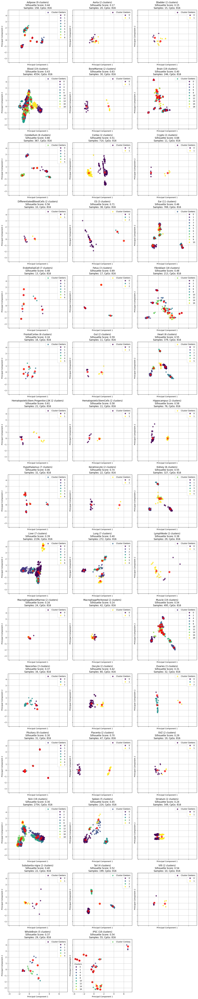

In [22]:
### Scatter plot of KM clustering of tissue datasets filtered by clock 2 CpGs - With PCA ### Clock

# Folder where scatter plots will be saved
folder = './Cluster Analysis/Clustering Results/Clock2/KM/Tissue Datasets/SCATTER PLOTS' ### Clock
os.makedirs(folder, exist_ok=True)

# Sort km_results_tissues by Tissue name
km_results_tissues = km_results_tissues.sort_values(by='Tissue')

# Create a figure with subplots for each tissue
num_tissues = len(km_results_tissues)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)
axs = axs.flatten()  # Flatten axs for easier indexing

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(km_results_tissues.iterrows()):
    tissue_name = row['Tissue']
    
    # Ensure there is a corresponding entry in km_results
    best_k_entry = km_results_tissues[km_results_tissues['Tissue'] == tissue_name]
    if best_k_entry.empty:
        print(f"No best k value found for tissue: {tissue_name}")
        continue  # Skip this tissue if no best k value is found

    # Get the best k value and silhouette score for the tissue
    best_k = best_k_entry['k'].values[0]
    silhouette = best_k_entry['silhouette_score'].values[0]

    # Load the saved cluster centers and labels
    tissue_folder = os.path.join('./Cluster Analysis/Clustering Results/Clock2/KM/Tissue Datasets', tissue_name) ### Clock
    centers_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_centers_k{best_k}_clock2.joblib') ### Clock
    labels_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_labels_k{best_k}_clock2.joblib') ### Clock

    if not os.path.exists(centers_path) or not os.path.exists(labels_path):
        print(f"Files do not exist for tissue: {tissue_name}")
        continue  # Skip if the files do not exist

    cluster_centers = joblib.load(centers_path)
    labels = joblib.load(labels_path)

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name].iloc[0]['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        print(f"Not enough samples for tissue: {tissue_name}")
        continue

    # Split the data into training and testing sets for k-means
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Ensure cluster_centers has same structure as X
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=X.columns)
    cluster_centers_pca = pca.transform(cluster_centers_df)

    # Calculate subplot position so we can access the correct axis for plotting and remove unused subplots
    ax = axs[subplot_idx]

    # Plot the data
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.scatter(cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], c='red', s=100, alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} ({best_k} clusters)\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    ax.legend(['Cluster Centers'], loc='upper right')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.scatter(cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], c='red', s=100, alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} ({best_k} clusters)\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    legend_tissue = ax_tissue.legend(*scatter_tissue.legend_elements(), title="Clusters")
    ax_tissue.add_artist(legend_tissue)
    ax_tissue.legend(['Cluster Centers'], loc='upper right')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2, 4])  # Set the y-axis limits for the individual plots
    ax_tissue.set_xlim([-3, 4])  # Set the x-axis limits for the individual plots
    fig_tissue.savefig(os.path.join(folder, f'{tissue_name}_scatter_plot_clock2.png')) ### Clock

    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(folder, 'combined_scatterplots_pca_kmeans_clock2.png') ### Clock
fig.savefig(combined_plot_path)

plt.show()

In [23]:
## KM Feature Analysis for each tissue dataset

# Select folder
base_folder = './Cluster Analysis/Clustering Results/Clock2/KM/Feature Analysis' ### Clock

# Perform feature analysis for each tissue
for index, row in km_results_tissues.iterrows():
    tissue_name = row['Tissue']
    labels = row['cluster_labels']

    # load the dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset, labels)
    
    # Save feature scores to a file
    os.makedirs(base_folder, exist_ok=True)
    output_path = os.path.join(base_folder, f'{tissue_name}_feature_scores_clock2.csv') ### Clock
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the 
feature_scores.head()

# takes aprox 1m 50 seconds to run

,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
630,cg20895555,38.349110,0.002200,851.292780,1.069363e-42,1.050802
626,cg20804050,38.250086,0.002270,130.533855,8.693264e-28,0.715583
24,cg01019040,36.182116,0.004337,322.454367,6.060342e-35,0.881657
135,cg05330587,30.319395,0.024132,97.992168,1.522721e-25,0.807617
790,cg26845017,27.634748,0.049391,29.731486,1.675257e-16,0.780614


## 2. Hierarchical clustering analysis of all tissue datasets filtered by clock2

### 2.1. Hierarchical Clustering of Full Methylation Dataset filtered by CpGs in clock 2

RUN THIS LATER. ITS PROBABLY GOING TO KILL THE KERNEL. 

CONSIDER SCRAPING THIS SECTION AND USE THE KM AS TEMPLATES ON CHATGPT TO MAKE OUTPUTS UNIFORM

In [24]:
# ### HC of complete methylation dataset with PCA, sampling and Dask of the complete dataset

# # Start a Dask client
# client = Client()

# # Function to perform clustering
# @delayed
# def hierarchical_clustering(X_sample, dataset, method, metric):

#     """
#     Perform hierarchical clustering on the given data.

#     Parameters:
#     - X_sample: The data to be clustered.
#     - method: The linkage method to be used.
#     - metric: The distance metric to be used.

#     """
#     try:
#         # Add an exception for the ward method, which only works with euclidean metric
#         if method == 'ward' and metric != 'euclidean':
#             return method, metric, None, None, None, None

#         # Perform hierarchical clustering
#         Z = linkage(X_sample, method=method, metric=metric)
        
#         # Calculate the cophenetic correlation
#         c, coph_dists = cophenet(Z, pdist(X_sample))

#         # Calculate the silhouette score
#         labels = fcluster(Z, t=0.7*np.max(Z[:, 2]), criterion='distance')
#         silhouette_avg = silhouette_score(X_sample, labels)

#         # Return the results
#         return method, metric, c, silhouette_avg, Z, labels
    
#     # Add an exception for any errors that may occur
#     except ValueError as e:
#         return method, metric, str(e), None, None, None

# # Data (assuming this is already defined in your environment)
# complete_dataset = complete_methylation_dataset_clock2_filtered.set_index('CpG').transpose()

# # Dataset name
# dataset = 'Complete Methylation Dataset'

# # Instantiate the results DataFrames
# hc_results_complete = pd.DataFrame(columns=['Dataset', 'Method', 'Metric', 'Cophonetic Correlation', 'Silhouette Score', 'Z', 'Cluster Labels'])
# hc_results_complete_errors = pd.DataFrame(columns=['Dataset', 'Method', 'Metric', 'Error'])

# # Select the data
# X = complete_dataset.values

# # Dimensionality reduction
# pca = PCA(n_components=50)
# X_reduced = pca.fit_transform(X)

# # Convert to Dask array with smaller chunks
# X_dask = da.from_array(X_reduced, chunks=(50, X_reduced.shape[1]))

# # Scatter the data to workers and broadcast it so that all workers have access to it
# X_dask_future = client.scatter(X_dask, broadcast=True)

# # Instantiate the methods and metrics to be tested
# methods = ['single', 'complete', 'average', 'ward']
# metrics = ['euclidean', 'cityblock', 'cosine']

# # Create a list of delayed tasks
# tasks = [hierarchical_clustering(X_dask_future, dataset, method, metric) for method in methods for metric in metrics]

# # Use Dask's ProgressBar to track progress
# print("Starting computation...")
# results = compute(*tasks)
# print("Computation completed.")

# # Add results to DataFrame
# for method, metric, c, silhouette_avg, Z, labels in results:
#     if c is not None:
#         hc_results_complete = hc_results_complete.append({
#             'Dataset': dataset,
#             'Method': method,
#             'Metric': metric,
#             'Cophonetic Correlation': c,
#             'Silhouette Score': silhouette_avg,
#             'Z': Z,
#             'Cluster Labels': labels
#         }, ignore_index=True)
#     else:
#         hc_results_complete_errors = hc_results_complete_errors.append({
#             'Dataset': dataset,
#             'Method': method,
#             'Metric': metric,
#             'Error': silhouette_avg
#         }, ignore_index=True)

# # Convert the results to Dask DataFrame
# dd_results_complete = dd.from_pandas(hc_results_complete, npartitions=1)
# dd_results_complete_errors = dd.from_pandas(hc_results_complete_errors, npartitions=1)

# # Compute and print the final results
# final_results = dd_results_complete.compute()
# final_errors = dd_results_complete_errors.compute()

# print("Final Results:")
# print(final_results.head())
# print("\nErrors:")
# print(final_errors.head())

# # Identify and save the best-performing model
# best_model = final_results.sort_values(by='Silhouette Score', ascending=False).iloc[0]
# best_Z = best_model['Z']
# best_labels = best_model['Cluster Labels']

# # Save top results using joblib for future plotting
# folder = './Cluster Analysis/Clustering Results/Clock2/HC/COMPLETE DATASET'  ### Clock
# os.makedirs(folder, exist_ok=True)

# joblib.dump(best_Z, f'{folder}/top_linkage_matrix_hc_results_complete_clock2.pkl') ### Clock
# joblib.dump(best_labels, f'{folder}/top_labels_hc_results_complete_clock2.pkl') ### Clock

# # Shut down the Dask client
# client.close()


In [25]:
# ### Scatter plot of hierarchical clustering of complete methylation dataset

# # Load the top linkage matrix and labels
# folder = './Cluster Analysis/Clustering Results/Clock2/HC/COMPLETE DATASET' ### Clock
# top_Z = joblib.load(f'{folder}/top_linkage_matrix_hc_results_complete_clock2.pkl') ### Clock
# top_labels = joblib.load(f'{folder}/top_labels_hc_results_complete_clock2.pkl') ### Clock

# # Transpose the dataset so that the samples are rows and CpGs are columns (CpGs as features)
# complete_dataset = df.set_index('CpG').transpose()

# # Select the data
# X = complete_dataset.iloc[:, :]  # All samples, all CpG features

# # Reduce the data to 2D using PCA
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X)

# # Create a DataFrame with the PCA results and labels
# pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
# pca_df['Cluster'] = top_labels

# # Plot the data using seaborn
# plt.figure(figsize=(10, 8))
# sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='viridis', data=pca_df, legend=False)
# plt.title('Hierarchical Clustering of Complete Methylation Dataset [clock 2]') ### Clock
# plt.show()

In [26]:
# ### Plot the dendrogram of the complete dataset using the best model
# method = best_model['Method']
# metric = best_model['Metric']
# Z = best_model['Z']

# plt.figure(figsize=(15, 5))
# dendrogram(Z, labels=complete_dataset.index, orientation='top')
# plt.title(f'Hierarchical Clustering Dendrogram\nMethod: {method}, Metric: {metric}')
# plt.xlabel('Samples')
# plt.ylabel('Distance')

# plt.show()

### 2.2. Hierarchical clustering of tissue datasets filtered by CpGs in clock 2

HC clustering without selecting best params. instead has several eval metric so I can ort through those and check if they make any difference.

In [27]:
#### Hierarchical Clustering of tissue datasets filtered by clock 2 CpGs  --- Other eval metrics but not auto selection of best method and metric. All combinations are saved. To be used with save_best_results function().

# Initialize result dataframes
hc_results = pd.DataFrame(columns=['Tissue', 'best_method', 'best_metric', 'best_num_clusters', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score', 'cluster_labels','Z'])
hc_results_errors = pd.DataFrame(columns=['Tissue', 'method', 'metric', 'num_clusters', 'error'])

# Loop through all tissue datasets
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Get shape of the dataset
    shape = tissue_dataset.shape

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        # Save the tissue name and method/metric that caused the error
        hc_results_errors.loc[len(hc_results_errors)] = [tissue_name, None, None, None, "Not enough samples for clustering"]
        continue
    
    # Split the data into training and testing sets for clustering
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Train the model and test different methods of linkage and distance metrics
    methods = ['single', 'complete', 'average', 'ward']
    metrics = ['euclidean', 'cityblock', 'cosine']
    num_clusters_range = range(2, 6)  # Example range of number of clusters to test
    
    for num_clusters in num_clusters_range:
        for method in methods:
            for metric in metrics:
                
                # Ward linkage only works with Euclidean distance
                if method == 'ward' and metric != 'euclidean':
                    continue
                try:
                    # Initialize Hierarchical clustering with current parameters
                    hierarchical = AgglomerativeClustering(linkage=method, metric=metric, n_clusters=num_clusters)
                    
                    # Fit the model to your data
                    hierarchical.fit(X)
                    
                    # Calculate the evaluation metrics
                    labels = hierarchical.labels_
                    silhouette_avg = silhouette_score(X, labels)
                    davies_bouldin_avg = davies_bouldin_score(X, labels)
                    calinski_harabasz_avg = calinski_harabasz_score(X, labels)

                    # Create the linkage matrix using scipy's linkage function because we need the 4 columns for the dendrogram later
                    Z = linkage(X, method=method, metric=metric)

                    # Save the results for the current combination
                    hc_results.loc[len(hc_results)] = [
                        tissue_name, method, metric, num_clusters, silhouette_avg, 
                        davies_bouldin_avg, calinski_harabasz_avg, labels, Z
                    ]

                except ValueError as e:
                    # Save the tissue name, method, metric, and number of clusters that caused the error
                    hc_results_errors.loc[len(hc_results_errors)] = [tissue_name, method, metric, num_clusters, str(e)]
                    continue

# Sort results by silhouette score (or any other metric if desired)
hc_results_tissues = hc_results.sort_values(by='calinski_harabasz_score', ascending=False)

# Display the results
hc_results_tissues.head()

#### Takes 7 min to run

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
129,Skin,ward,euclidean,2,0.214557,1.777938,791.863123,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[1906.0, 1907.0, 0.2357069974896238, 2.0], [1..."
49,Liver,ward,euclidean,2,0.321227,1.720491,601.715573,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[1134.0, 1138.0, 0.352230869450627, 2.0], [11..."
9,Cortex,ward,euclidean,2,0.508413,1.040094,587.341994,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[536.0, 538.0, 0.37836199596646963, 2.0], [49..."
139,Skin,ward,euclidean,3,0.211381,2.324150,563.565217,"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[[1906.0, 1907.0, 0.2357069974896238, 2.0], [1..."
479,Cerebellum,ward,euclidean,5,0.647499,0.811769,538.848930,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[358.0, 360.0, 0.30784270772332484, 2.0], [33..."


In [28]:
hc_results_errors.head()

,Tissue,method,metric,num_clusters,error


Running the scrip above does not automatically select the best number of clusters. It has several evaluation metrics that can be used to determine the optimal number of clusters, such as the silhouette score, the Calinski-Harabasz index, and the Davies-Bouldin index. The script also generates a dendrogram to visualize the hierarchical clustering of the samples based on the selected CpGs.

The script below saves different versions of the results, depending on the evaluation metric. This means that we can compare the results based on different evaluation metrics and choose the best clustering solution for further analysis. Particularly via dendrogram visualization, as despite having high silhouette scores initially, the clusters were not be well separated.

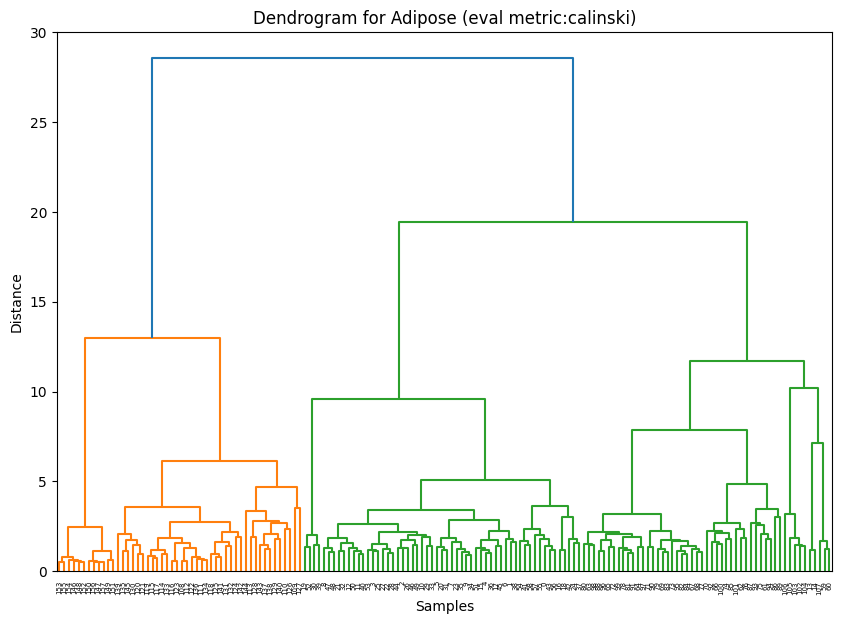

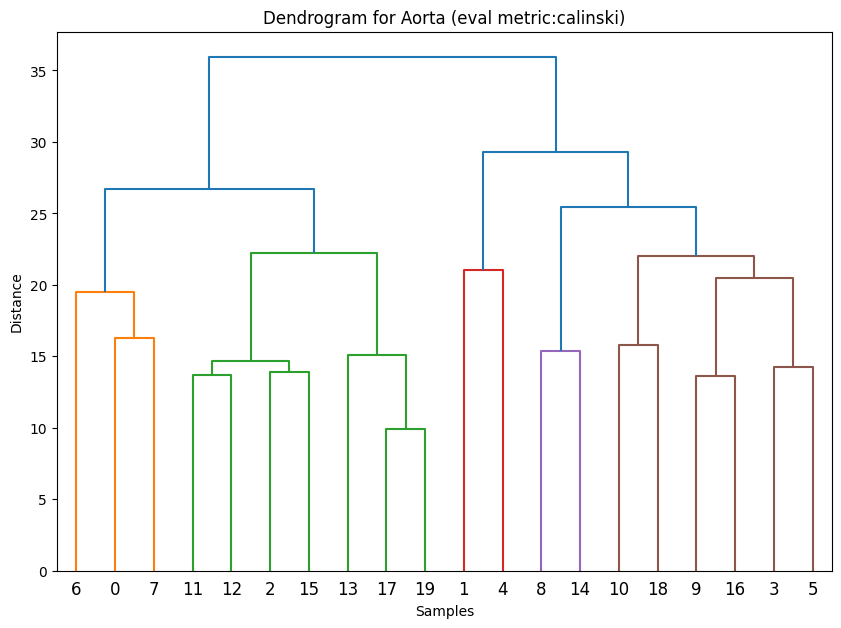

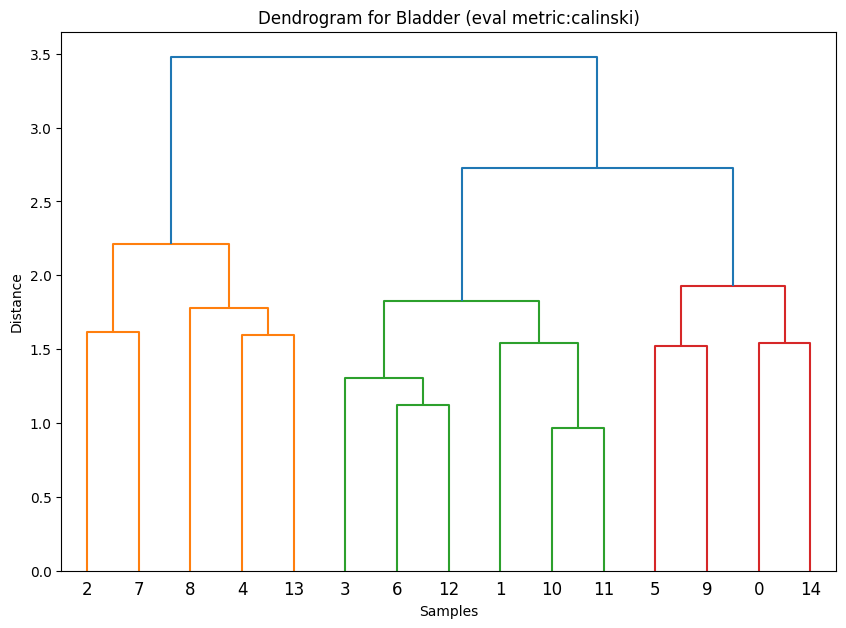

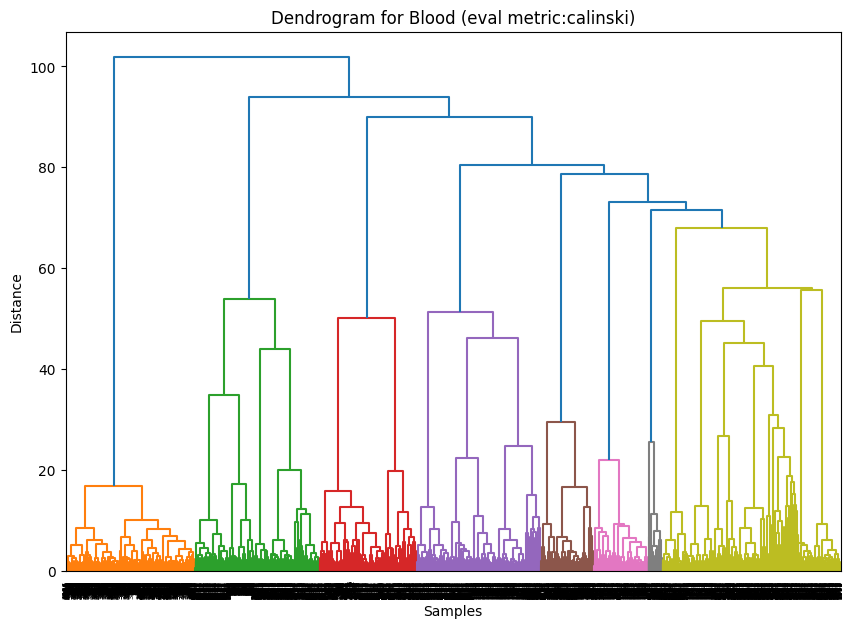

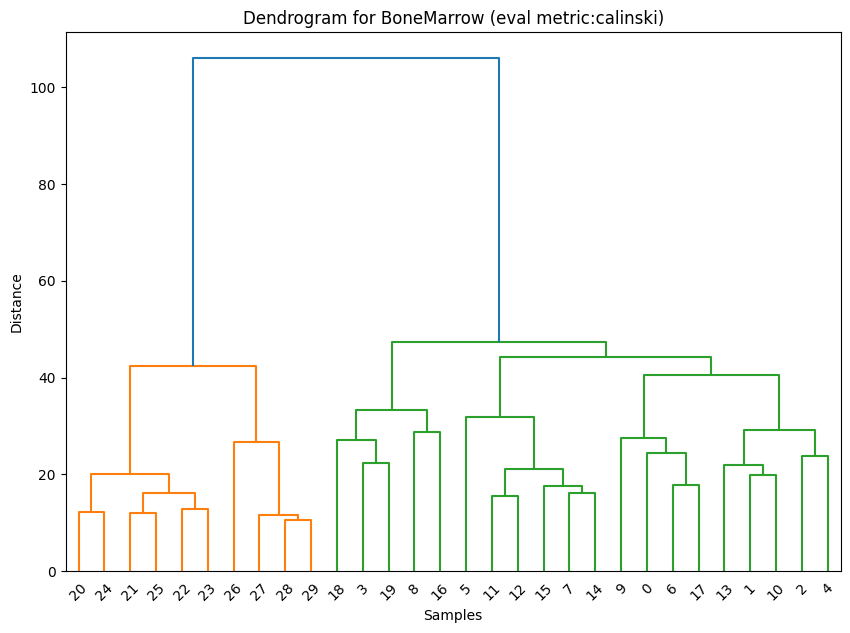

...

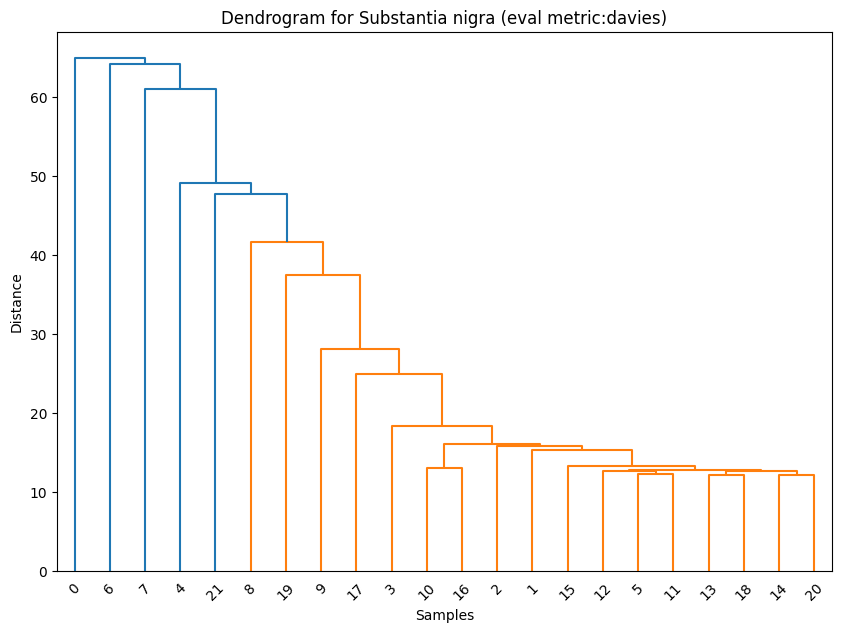

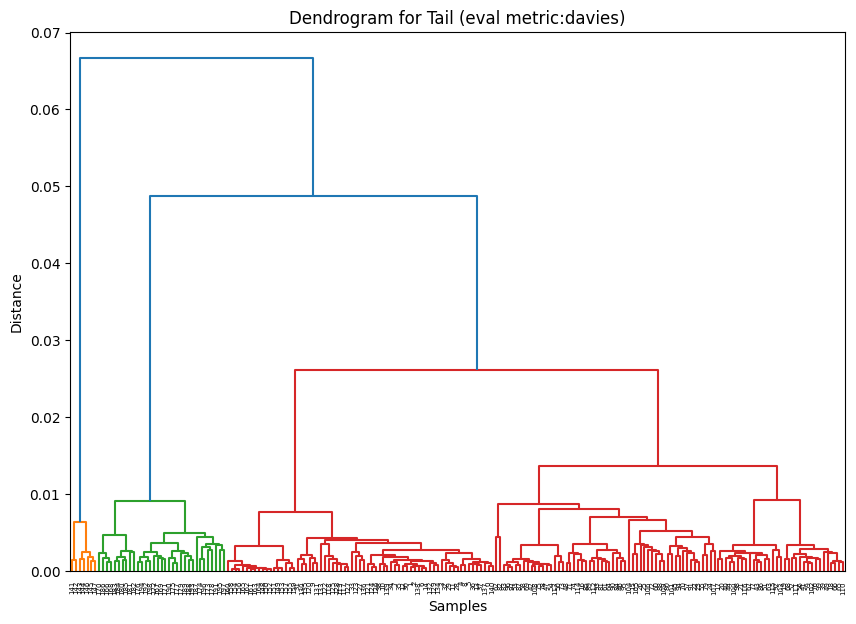

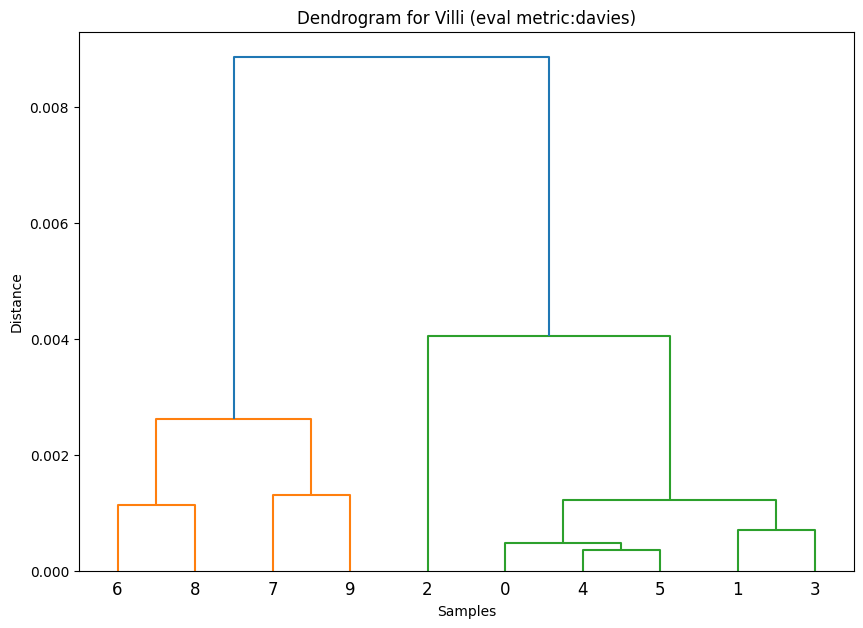

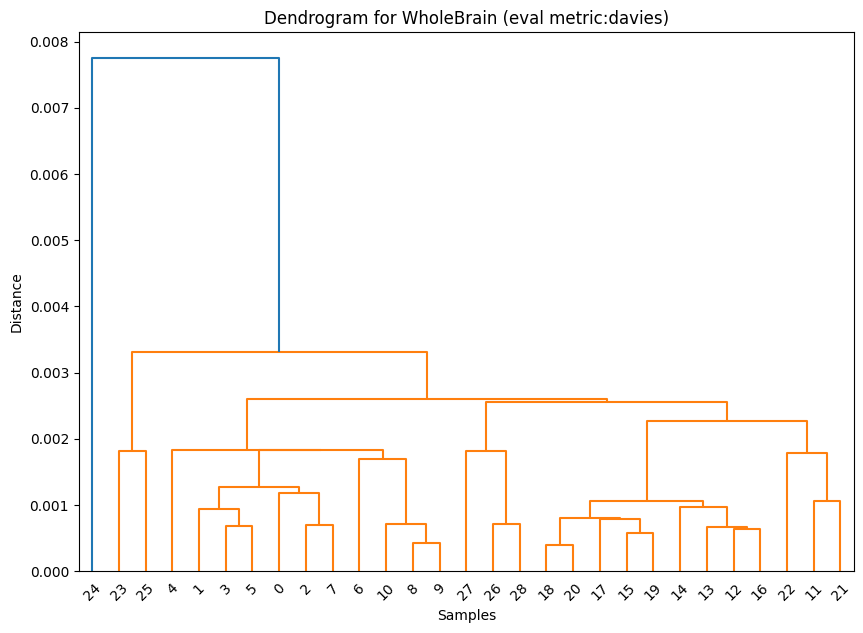

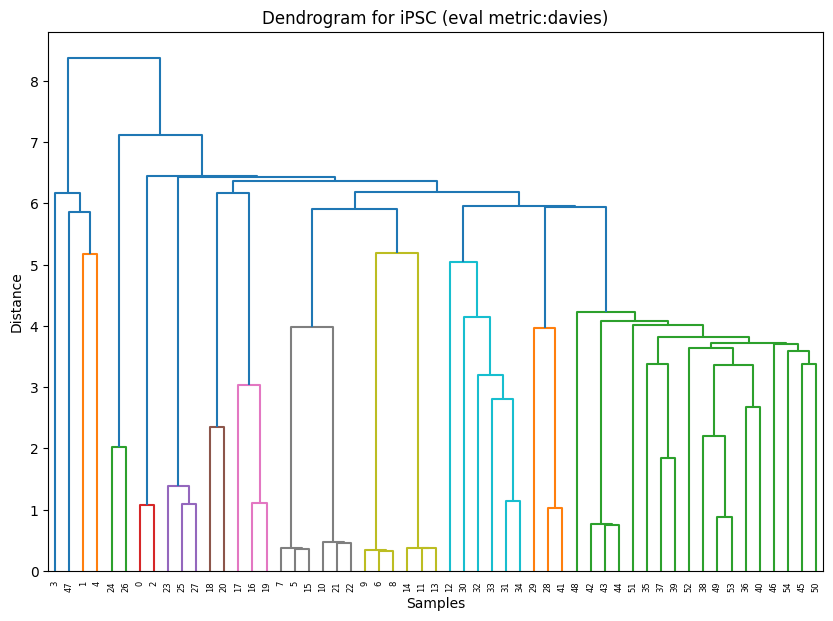

In [29]:
### Save the best results for each tissue dataset and evaluation metric

#### Save the best results for each tissue dataset and evaluation metric
#### Also saves dendrogram plots for each evaluation metric

# Folder where the 
read_folder = './Cluster Analysis/Clustering Results/Clock2/HC/Tissue Datasets' ### Clock

# Function to save best results
def save_best_results(hc_best_results, metric):
    for index, row in hc_best_results.iterrows():
        tissue_name = row['Tissue']
        Z = row['Z']
        best_num_clusters = row['cluster_labels']
        
        # Assuming 'X' is available from your dataset
        tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].values[0]
        tissue_dataset = tissue_dataset.set_index('CpG').transpose()
        
        X = tissue_dataset
        
        # Save cluster labels and linkage matrix using joblib
        tissue_folder = os.path.join(read_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)
        
        labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{metric}_clock2.joblib') ### Clock
        Z_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_Z_{metric}_clock2.joblib') ### Clock
        
        joblib.dump(best_num_clusters, labels_path)
        joblib.dump(Z, Z_path)

        # Visualize dendrogram
        plt.figure(figsize=(10, 7))
        plt.title(f'Dendrogram for {tissue_name} (eval metric:{metric})')
        dendrogram(Z)
        plt.xlabel('Samples')
        plt.ylabel('Distance')

        # Save the plot
        folder = './Cluster Analysis/Clustering Results/Clock2/HC/Tissue Datasets/DENDROGRAM' ### Clock
        os.makedirs(folder, exist_ok=True)
        plt.savefig(os.path.join(folder, f'hc_{tissue_name}_dendrogram_{metric}_clock2.png')) ### Clock
        plt.show()


# Sort results and save best for each metric
hc_best_results_calinski = hc_results_tissues.sort_values(by='calinski_harabasz_score', ascending=False).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_calinski, 'calinski')

hc_best_results_silhouette = hc_results_tissues.sort_values(by='silhouette_score', ascending=False).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_silhouette, 'silhouette')

hc_best_results_davies = hc_results_tissues.sort_values(by='davies_bouldin_score', ascending=True).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_davies, 'davies')

In [30]:
hc_best_results_silhouette.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,ward,euclidean,5,0.409687,1.330355,65.853110,"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, ...","[[147.0, 157.0, 0.4906470967913481, 2.0], [148..."
1,Aorta,complete,cosine,2,0.191311,1.635176,5.493798,"[0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, ...","[[17.0, 19.0, 0.000431844033671025, 2.0], [2.0..."
2,Bladder,complete,euclidean,2,0.196151,1.369493,3.892785,"[0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]","[[10.0, 11.0, 0.9688564925626697, 2.0], [6.0, ..."
3,Blood,single,cityblock,2,0.441258,0.731126,38.004866,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[2944.0, 3016.0, 4.908716791070659, 2.0], [36..."
4,BoneMarrow,ward,euclidean,2,0.633823,0.525939,81.121097,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[28.0, 29.0, 0.536867970306539, 2.0], [27.0, ..."


In [31]:
hc_best_results_calinski.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,ward,euclidean,2,0.357763,1.166230,81.991504,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[147.0, 157.0, 0.4906470967913481, 2.0], [148..."
1,Aorta,complete,cityblock,2,0.164967,1.754077,5.601329,"[1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, ...","[[17.0, 19.0, 9.935885622976958, 2.0], [9.0, 1..."
2,Bladder,ward,euclidean,2,0.169849,1.673383,4.058699,"[0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]","[[10.0, 11.0, 0.9688564925626697, 2.0], [6.0, ..."
3,Blood,ward,euclidean,5,0.213989,2.107859,521.757916,"[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...","[[2944.0, 3016.0, 0.24964506519335028, 2.0], [..."
4,BoneMarrow,complete,cityblock,2,0.633823,0.525939,81.121097,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[28.0, 29.0, 10.54334755310091, 2.0], [27.0, ..."


In [32]:
hc_best_results_davies.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,single,cityblock,5,0.353500,0.816222,28.626346,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, ...","[[147.0, 157.0, 9.553133839008106, 2.0], [156...."
1,Aorta,single,euclidean,2,0.172473,0.644700,2.080756,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[17.0, 19.0, 0.5179297032244737, 2.0], [2.0, ..."
2,Bladder,single,cityblock,3,0.145378,0.619721,2.191621,"[0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0]","[[10.0, 11.0, 17.538750336985412, 2.0], [6.0, ..."
3,Blood,single,cityblock,2,0.441258,0.731126,38.004866,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[2944.0, 3016.0, 4.908716791070659, 2.0], [36..."
4,BoneMarrow,single,euclidean,2,0.633823,0.525939,81.121097,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[28.0, 29.0, 0.536867970306539, 2.0], [27.0, ..."


After looking at the dendrograms produced using different eval metrics, the one that produced the best clusters was the Calinski Harabasz metric. For that reason, we will use this metric to determine the optimal number of clusters for the hierarchical clustering of the tissue datasets.

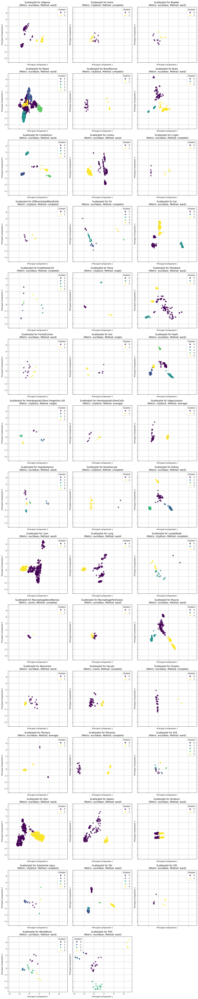

In [33]:
### Scatter plot of hierarchical clustering of tissue datasets filtered by clock 2 CpGs - With PCA

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock2/HC/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock2/HC/Tissue Datasets/SCATTER PLOTS' ### Clock
os.makedirs(save_folder, exist_ok=True)

# Define the evaluation metric
eval_metric = 'calinski'

# Sort hc_best_results_calinski by tissue name
hc_best_results_calinski = hc_best_results_calinski.sort_values(by='Tissue')

# Create a figure with subplots for each tissue
num_tissues = len(hc_best_results_calinski)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)
axs = axs.flatten()  # Flatten axs for easier indexing

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(hc_best_results_calinski.iterrows()):
    tissue_name = row['Tissue']
    metric = row['best_metric']
    method = row['best_method']
    
    # Load the best labels for the current tissue
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{eval_metric}_clock2.joblib') ### Clock
    
    if not os.path.exists(labels_path):
        print(f"Labels file does not exist for tissue: {tissue_name}")
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Get the dataset for the current tissue
    tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name].iloc[0]['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        print(f"Not enough samples for tissue: {tissue_name}")
        continue

    X = tissue_dataset

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'Scatterplot for {tissue_name} \n (Metric: {metric}, Method: {method})')
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'Scatterplot for {tissue_name} \n (Metric: {metric}, Method: {method})')
    legend_tissue = ax_tissue.legend(*scatter_tissue.legend_elements(), title="Clusters")
    ax_tissue.add_artist(legend_tissue)
    ax_tissue.grid()
    ax_tissue.set_ylim([-2, 4])  # Set the y-axis limits for the individual plots
    ax_tissue.set_xlim([-3, 4])  # Set the x-axis limits for the individual plots
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_clock2.png')) ### Clock
    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_calinski_clock2.png') ### Clock
fig.savefig(combined_plot_path) 

plt.show()

In [34]:
#### Feature Analysis for Hierarchical Clustering of tissue datasets filtered by clock 2 CpGs  -- Using the best clustering results based on the Calinski-Harabasz score

# Select folder
read_folder = './Cluster Analysis/Clustering Results/Clock2/HC/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock2/HC/Feature Analysis' ### Clock

# Evaluation metric
eval_metric = 'calinski'

# Perform feature analysis for each tissue
for index, row in hc_best_results_calinski.iterrows(): # Dataframe with the best results for specific evaluation metric
    tissue_name = row['Tissue']
    
    # Load the best labels for the current tissue
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{eval_metric}_clock2.joblib') ### Clock
    labels = joblib.load(labels_path)

    # Load the dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset, labels)
    
    # Check or create the output folder
    output_folder = os.path.join(save_folder)
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f'{tissue_name}_feature_scores_clock2.csv') ### Clock

    # Save the feature scores to a CSV file
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the first tissue
feature_scores.head()

,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
626,cg20804050,38.208456,2.553346e-08,956.058179,8.654777e-45,0.556908
630,cg20895555,37.775262,3.153708e-08,955.774502,8.719344e-45,0.554072
24,cg01019040,34.559484,1.509346e-07,314.707128,7.050947e-33,0.481347
135,cg05330587,30.289570,1.199437e-06,732.215845,6.779629e-42,0.576000
790,cg26845017,27.240712,5.241423e-06,191.596598,9.514993e-28,0.149762


## 3. DBSCAN analysis of all tissue datasets filtered by clock2

### 3.1. DBSCAN of Full Methylation Dataset filtered by CpGs in clock 2

In [35]:
# ### Plotting the k-distance graph to help choose an appropriate eps value

# def plot_k_distance(X, k):
#     neighbors = NearestNeighbors(n_neighbors=k)
#     neighbors_fit = neighbors.fit(X)
#     distances, indices = neighbors_fit.kneighbors(X)
#     distances = np.sort(distances[:, k-1], axis=0)
#     plt.plot(distances)
#     plt.title('k-distance Graph')
#     plt.xlabel('Data Points sorted by distance')
#     plt.ylabel(f'{k}-th Nearest Neighbor Distance')
#     plt.show()

# X1 = complete_methylation.set_index('CpG').transpose()
# X2 = complete_methylation_dataset_clock2_filtered.set_index('CpG').transpose()  ### Clock

# plot_k_distance(X1, k=4)
# plot_k_distance(X2, k=4)

In [36]:
# print(f'The shape of the Complete Methylation Dataset is: {X1.shape}, so the number of dimensions (CpGs) is: {X1.shape[1]}')
# print(f'The shape of the Complete Methylation Dataset filtered by clock 2 CpGs is: {X2.shape}, so the number of dimensions (CpGs) is: {X2.shape[1]}') ### Clock

Choosing the params using the elbow method.

EPS: 
The "elbow" in the graph is where the distance starts to increase rapidly, indicating a natural choice for eps. 
For X1 ( the full methylation dataset), the optimal eps value is around 15-20. 
For X2 (filtered complete methylation), the optimal eps value is around 1-2. 

MIN_SAMPLES:
The optimal value for min_samples is usually determined by the number of features in the dataset, and a good rule of thumb is 2 x number of dimensions. 
For X1, the optimal min_samples value is around 7000. However, that is too high and unrealistic. So we will try 10 - 50. 
For X2, the optimal min_samples value is around 670. Again, this is too high, so we will try 10 - 50.

In [37]:
# #### DBSCAN Clustering of Complete dataset filtered by clock 2 CpGs

# # Load the dataset (assuming complete_methylation is loaded)
# X = complete_methylation_dataset_clock2_filtered.set_index('CpG').transpose()  ### Clock

# # Adjusted DBSCAN function with plotting
# @delayed
# def dbscan_clustering_importantCpGs(X, eps, min_samples):
#     results = []

#     try:
#         # Perform DBSCAN with current parameters
#         dbscan = DBSCAN(eps=eps, min_samples=min_samples)
#         dbscan.fit(X)

#         # Check the number of clusters
#         n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

#         # Check the number of core samples
#         core_samples = np.sum(dbscan.labels_ != -1)

#         # Calculate Silhouette Score
#         if n_clusters > 1:
#             silhouette_avg = silhouette_score(X, dbscan.labels_)
#         else:
#             silhouette_avg = -1

#         # Save the results
#         results.append([eps, min_samples, silhouette_avg, n_clusters, core_samples, dbscan.labels_.tolist(), X.shape[1], X.shape])

#     except ValueError as e:
#         print(f"Error: {e}")
#         pass

#     return results

# # Prepare delayed functions for each parameter combination
# eps_values = range(4,15)  # Based on the elbow plot
# min_samples_values = range(2, 15)

# tasks = [dbscan_clustering_importantCpGs(X, eps, min_samples) for eps in eps_values for min_samples in min_samples_values]

# # Compute the tasks in parallel
# results_list = compute(*tasks)

# # Combine results
# dbscan_results_complete_list = [item for sublist in results_list for item in sublist]

# # Convert results list to a DataFrame
# dbscan_results_complete_df = pd.DataFrame(dbscan_results_complete_list, columns=['eps', 'min_samples', 'silhouette_score', 'n_clusters', 'core_samples', 'cluster_labels', 'total_features', 'dataset_shape'])

# # Sort results by silhouette score
# dbscan_results_complete = dbscan_results_complete_df.sort_values(by='silhouette_score', ascending=False)

# # Select the best results
# best_results = dbscan_results_complete.iloc[0]
# best_labels = best_results['cluster_labels']
# best_eps = best_results['eps']
# best_min_samples = best_results['min_samples']

# # Save the best results using joblib
# folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/COMPLETE DATASET FILTERED' ### Clock
# os.makedirs(folder, exist_ok=True)

# joblib.dump(best_labels, f'{folder}/best_labels_dbscan_results_complete_clock2.pkl') ### Clock
# joblib.dump(best_eps, f'{folder}/best_eps_dbscan_results_complete_clock2.pkl') ### Clock
# joblib.dump(best_min_samples, f'{folder}/best_min_samples_dbscan_results_complete_clock2.pkl') ### Clock

# # Display the results
# dbscan_results_complete.head()

In [38]:
# ### Scatter plot of DBSCAN Clustering of Complete dataset filtered by clock 2 CpGs

# # Load the best params and labels
# folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/COMPLETE DATASET FILTERED' ### Clock
# best_labels = joblib.load(f'{folder}/best_labels_dbscan_results_complete_clock2.pkl') ### Clock
# best_eps = joblib.load(f'{folder}/best_eps_dbscan_results_complete_clock2.pkl') ### Clock
# best_min_samples = joblib.load(f'{folder}/best_min_samples_dbscan_results_complete

# X = complete_methylation_dataset_clock2_filtered.set_index('CpG').transpose()  ### Clock

# # PCA
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X)

# # Plot the clusters
# plt.figure(figsize=(10, 6))

# # Plot the clusters
# scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=best_labels, cmap='viridis')
# plt.title(f'DBSCAN Clustering of Complete Methylation Dataset clock 2 Filtered\neps={best_eps}, min_samples={best_min_samples}')
# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.colorbar(label='Cluster')

# # Save the plot
# folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/COMPLETE DATASET' ### Clock
# os.makedirs(folder, exist_ok=True)
# plt.savefig(os.path.join(folder, 'scatter_plot_dbscan_complete_dataset_clock2.png')) ### Clock

# plt.show()

### 3.2. DBSCAN clustering of tissue datasets filtered by CpGs in clock 2

In [39]:
#### DBSCAN Clustering of tissue datasets filtered by clock 2 CpGs - With Noise Removal & PCA
# keeping track of noise points, calculating the silhouette score before and after noise removal, and performing PCA    

# Results dataframe
dbscan_results = pd.DataFrame(columns=['Tissue', 'eps', 'min_samples', 'silhouette_score', 'silhouette_score_without_noise', 'n_clusters', 'core_samples', 'n_noise', 'noise_ratio', 'full_labels', 'non_noise_labels', 'total_features', 'dataset_shape'])
dbscan_results_errors = pd.DataFrame(columns=['Tissue', 'eps', 'min_samples', 'Error'])

# Create directories to save results
base_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets'  ### Clock
os.makedirs(base_folder, exist_ok=True)

# Function to perform DBSCAN on a single tissue dataset
@delayed
def dbscan_clustering(tissue_name, tissue_dataset):
    results = []
    errors = []

    # Check if the dataset is non-empty and then transpose the dataset
    if tissue_dataset.empty:
        errors.append([tissue_name, None, None, "Empty dataset"])
        return results, errors

    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        errors.append([tissue_name, None, None, "Not enough samples for clustering"])
        return results, errors

    # Select the data for clustering
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Calculate the max distance between samples
    max_distance = np.max(squareform(pdist(X)))

    # Train the model and test different values of epsilon and min_samples
    eps_values = np.arange(0.1 * max_distance, 1.1 * max_distance, 0.05 * max_distance)  # Adjust step size for efficiency
    min_samples_values = range(2, 10)

    best_silhouette_score = -1
    best_silhouette_score_without_noise = -1
    best_eps = None
    best_min_samples = None
    best_labels = None
    best_labels_without_noise = None
    best_n_clusters = None
    best_core_samples = None
    best_n_noise = None
    best_noise_ratio = None

    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                # Perform DBSCAN with current parameters
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                dbscan.fit(X)

                # Check the number of clusters
                n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

                # Check the number of core samples and noise points
                core_samples = np.sum(dbscan.labels_ != -1)
                n_noise = np.sum(dbscan.labels_ == -1)
                noise_ratio = n_noise / X.shape[0]

                # Calculate Silhouette Score
                if n_clusters > 1:
                    silhouette_avg = silhouette_score(X, dbscan.labels_)
                else:
                    silhouette_avg = -1

                # Calculate Silhouette Score without noise points
                non_noise_mask = dbscan.labels_ != -1
                if n_clusters > 1 and np.any(non_noise_mask):
                    silhouette_avg_without_noise = silhouette_score(X[non_noise_mask], dbscan.labels_[non_noise_mask])
                else:
                    silhouette_avg_without_noise = -1

                # Update the best model if the current one is better
                # Consider both silhouette score and noise ratio in model selection
                if silhouette_avg > best_silhouette_score and noise_ratio < 0.5:  # Adjust threshold as needed
                    best_silhouette_score = silhouette_avg
                    best_silhouette_score_without_noise = silhouette_avg_without_noise
                    best_eps = eps
                    best_min_samples = min_samples
                    best_labels = dbscan.labels_
                    best_labels_without_noise = dbscan.labels_[non_noise_mask]
                    best_n_clusters = n_clusters
                    best_core_samples = core_samples
                    best_n_noise = n_noise
                    best_noise_ratio = noise_ratio

            except ValueError as e:
                errors.append([tissue_name, eps, min_samples, str(e)])
                continue

    # Save the best results for the current tissue
    if best_eps is not None:
        results.append([tissue_name, best_eps, best_min_samples, best_silhouette_score, 
                        best_silhouette_score_without_noise, best_n_clusters, best_core_samples, 
                        best_n_noise, best_noise_ratio, best_labels, best_labels_without_noise, 
                        X.shape[1], X.shape])
        # Keep both full labels and non-noise labels
        non_noise_mask = best_labels != -1 ### addded this
        best_labels_without_noise = best_labels[non_noise_mask] ### addded this
 
        # Save cluster labels using joblib
        tissue_folder = os.path.join(base_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)

        labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_clock2.joblib')  ### Clock
        joblib.dump(best_labels, labels_path)

        labels_path_without_noise = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_without_noise_clock2.joblib')  ### Clock
        joblib.dump(best_labels_without_noise, labels_path_without_noise)

        # Save X without the noise points
        X_without_noise = X[non_noise_mask]
        X_without_noise_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock2.joblib')  ### Clock
        joblib.dump(X_without_noise, X_without_noise_path)

        # Report noise points in the results
        print(f"Tissue: {tissue_name}")
        print(f"Number of noise points: {best_n_noise}")
        print(f"Percentage of noise points: {best_noise_ratio * 100:.2f}%")
        print(f"Silhouette score: {best_silhouette_score}")
        print(f"Silhouette score without noise: {best_silhouette_score_without_noise}")
        print("---")

    return results, errors

# Prepare delayed functions for each tissue dataset
tasks = [dbscan_clustering(row['Tissue'], row['Dataset']) for index, row in tissue_datasets.iterrows()]

# Compute the tasks in parallel
results_list = compute(*tasks)

# Combine results and errors
dbscan_results_list = [item for sublist in results_list for item in sublist[0]]
dbscan_results_errors_list = [item for sublist in results_list for item in sublist[1]]

# Convert results lists to DataFrames
dbscan_results_df = pd.DataFrame(dbscan_results_list, columns=['Tissue', 'eps', 'min_samples', 'silhouette_score', 'silhouette_score_without_noise', 'n_clusters', 'core_samples', 'n_noise', 'noise_ratio', 'full_labels', 'non_noise_labels', 'total_features', 'dataset_shape'])

dbscan_results_errors_df = pd.DataFrame(dbscan_results_errors_list, columns=['Tissue', 'eps', 'min_samples', 'Error'])

# Sort results by silhouette score
dbscan_results_tissues = dbscan_results_df.sort_values(by='silhouette_score', ascending=False)

# Display the results
dbscan_results_tissues.head()

Tissue: FrontalCortex
Number of noise points: 4
Percentage of noise points: 25.00%
Silhouette score: 0.13632656777454225
Silhouette score without noise: 0.24568036650066957
---
Tissue: DifferentiatedBloodCells
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.5599673755679174
Silhouette score without noise: 0.5599673755679054
---
Tissue: WholeBrain
Number of noise points: 2
Percentage of noise points: 6.90%
Silhouette score: 0.3385021982807144
Silhouette score without noise: 0.39917203582659627
---
Tissue: Hippocampus
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.5780301108882885
Silhouette score without noise: 0.5780301108882991
---
Tissue: Striatum
Number of noise points: 3
Percentage of noise points: 0.86%
Silhouette score: 0.08778224234060931
Silhouette score without noise: 0.1559248442233805
---
Tissue: Villi
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.5359238080287696
Silhouette sc

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
22,Keratinocyte,3.146131,2,0.740905,0.740905,2,22,0,0.0,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",816,"(22, 816)"
35,ES,2.286747,2,0.709721,0.709721,3,38,0,0.0,"[0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",816,"(38, 816)"
32,Placenta,2.477216,2,0.704626,0.704626,2,47,0,0.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",816,"(47, 816)"
36,Fetus,1.798162,2,0.687629,0.687629,3,17,0,0.0,"[0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, ...","[0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, ...",816,"(17, 816)"
38,Crypts,1.369203,2,0.680177,0.680177,2,11,0,0.0,"[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]","[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]",816,"(11, 816)"


In [40]:
# List of tissues where the noise reduction improved the silhouette score
tolerance = 1e-10
filtered_results = dbscan_results_tissues[dbscan_results_tissues["silhouette_score_without_noise"] > dbscan_results_tissues["silhouette_score"] + tolerance]
filtered_results.head()

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
7,Kidney,3.132771,2,0.565921,0.595247,12,315,12,0.036697,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",816,"(327, 816)"
12,Heart,2.479675,2,0.556636,0.565028,7,375,4,0.010554,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, ...",816,"(379, 816)"
0,Cortex,4.221583,2,0.545788,0.550050,2,713,1,0.001401,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",816,"(714, 816)"
4,Muscle,3.376262,2,0.526636,0.541297,20,485,10,0.020202,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...",816,"(495, 816)"
5,Fibroblast,2.227473,2,0.522639,0.632997,26,184,29,0.136150,"[-1, -1, -1, -1, -1, -1, -1, -1, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, ...",816,"(213, 816)"


In [41]:
# Number of tissues for which the silhouette without noise is higher than the silhouette with noise
print('The number of tissues for which the silhouete score improved after noise removal is:', len(dbscan_results_tissues[dbscan_results_tissues["silhouette_score_without_noise"] > dbscan_results_tissues["silhouette_score"]]))

The number of tissues for which the silhouete score improved after noise removal is: 31


In [42]:
# Percentage of improvement in silhouette score after noise removal
improvement = (dbscan_results_tissues["silhouette_score_without_noise"] - dbscan_results_tissues["silhouette_score"]) / dbscan_results_tissues["silhouette_score"] * 100
print(f'The average percentage improvement in silhouette score after noise removal is: {improvement.mean():.2f} %')

The average percentage improvement in silhouette score after noise removal is: 11.70 %


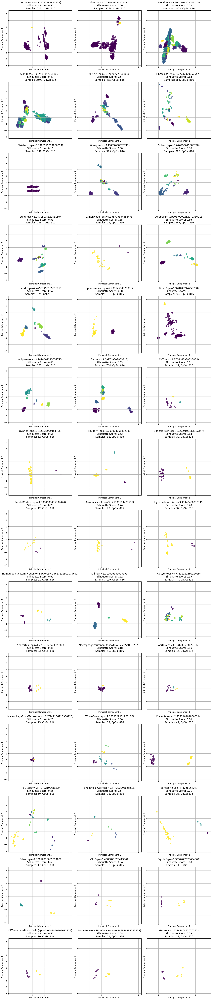

In [43]:
#### Scatter plot of DBSCAN Clustering of tissue datasets filtered by clock 2 CpGs - Noise Removal & PCA 

# Sort the DBSCAN results by tissue name
dbscan_results_tissues = dbscan_results_tissues.sort_values(by='Tissue')

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets'  # Adjust as needed
save_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets/SCATTER PLOTS/Noise Removed'  # Adjust as needed
os.makedirs(save_folder, exist_ok=True)

# Create a figure with subplots for each tissue
num_tissues = len(tissue_datasets)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), sharex=True, sharey=True)

# Flatten axs array
axs = axs.flatten()

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(tissue_datasets.iterrows()):
    tissue_name = row['Tissue']

    # Ensure there is a corresponding entry in dbscan_results
    best_eps_entry = dbscan_results_tissues[dbscan_results_tissues['Tissue'] == tissue_name]
    if best_eps_entry.empty:
        continue  # Skip this tissue if no best eps value is found

    # Get the best eps value, min_samples and silhouette score for the tissue
    best_eps = best_eps_entry['eps'].values[0]
    best_min_samples = best_eps_entry['min_samples'].values[0]
    silhouette = best_eps_entry['silhouette_score_without_noise'].values[0]

    # Load the saved cluster labels
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_without_noise_clock2.joblib')

    if not os.path.exists(labels_path):
        print('Labels file does not exist for tissue:', tissue_name)
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Load the filtered dataset
    X_filtered_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock2.joblib')
    X_filtered = joblib.load(X_filtered_path)
    X = X_filtered

    # Check if the data and labels are valid
    if X.size == 0 or labels.size == 0:
        continue  # Skip this tissue if data or labels are empty

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Check if PCA transformation is successful
    if X_pca.size == 0:
        continue  # Skip this tissue if PCA results in empty data

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {X.shape[0]}, CpGs: {X.shape[1]}')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {X.shape[0]}, CpGs: {X.shape[1]}')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2.5, 4.5])
    ax_tissue.set_xlim([-2.5, 4.5])
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_without_noise_clock2.png'))  ### Clock
    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_dbscan_without_noise_clock2.png')  # Adjust as needed
fig.savefig(combined_plot_path)

plt.show()


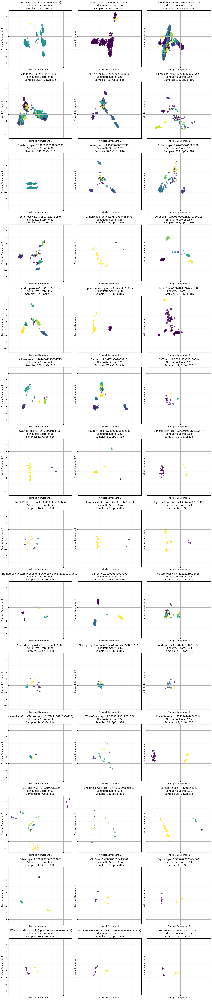

In [44]:
### Scatter plot of DBSCAN clustering of tissue datasets filtered by clock 2 CpGs - PCA & Without noise removal 

# Sort the DBSCAN results by tissue name
dbscan_results_tissues = dbscan_results_tissues.sort_values(by='Tissue')

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets/SCATTER PLOTS/Noise Kept' ### Clock
os.makedirs(save_folder, exist_ok=True)

# Create a figure with subplots for each tissue
num_tissues = len(tissue_datasets)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)

# Flatten axs array
axs = axs.flatten()

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(tissue_datasets.iterrows()):
    tissue_name = row['Tissue']

    # Ensure there is a corresponding entry in dbscan_results
    best_eps_entry = dbscan_results_tissues[dbscan_results_tissues['Tissue'] == tissue_name]
    if best_eps_entry.empty:
        continue  # Skip this tissue if no best eps value is found

    # Get the best eps value and silhouette score for the tissue
    best_eps = best_eps_entry['eps'].values[0]
    best_min_samples = best_eps_entry['min_samples'].values[0]
    silhouette = best_eps_entry['silhouette_score'].values[0]

    # Load the saved cluster labels
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_clock2.joblib') ### Clock

    if not os.path.exists(labels_path):
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = row['Dataset'].set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        continue

    X = tissue_dataset

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # For the filtered dataset to pass, this script needs to be modified to have this instead
    # # Filter X to remove noise points
    # non_noise_mask = full_labels != -1
    # X_filtered = X[non_noise_mask]

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2.5, 4.5])
    ax_tissue.set_xlim([-2.5, 4.5])
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_clock2.png')) ### Clock
    plt.close(fig_tissue) 

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_dbscan_clock2.png') ### Clock
fig.savefig(combined_plot_path)

plt.show()

In [45]:
#### Feature Analysis for DBSCAN Clustering of tissue datasets filtered by clock 2 CpGs - With noise removal

# Select folder
read_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets'  ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock2/DBSCAN/Feature Analysis'  ### Clock

# Perform feature analysis for each tissue
for index, row in dbscan_results_tissues.iterrows():
    tissue_name = row['Tissue']
    
    # Load the best labels for the current tissue (without noise)
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{row["eps"]}_min_samples{row["min_samples"]}_without_noise_clock2.joblib') ### Clock
    labels_without_noise = joblib.load(labels_path)

    # Load the dataset without noise
    X_without_noise_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{row["eps"]}_min_samples{row["min_samples"]}_clock2.joblib') ### Clock 
    X_without_noise = joblib.load(X_without_noise_path)

    # Load the original dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Get the non-noise samples
    non_noise_mask = row['full_labels'] != -1
    dataset_without_noise = dataset.iloc[non_noise_mask]

    # Ensure that the number of samples in dataset_without_noise matches X_without_noise
    assert dataset_without_noise.shape[0] == X_without_noise.shape[0], "Mismatch in number of samples"

    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset_without_noise, labels_without_noise)
    
    # Check or create the output folder
    output_folder = os.path.join(save_folder)
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f'{tissue_name}_feature_scores_without_noise_clock2.csv') ### Clock

    # Save the feature scores to a CSV file
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the first tissue
feature_scores.head()


,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
604,cg20076842,24.577372,0.006207,3394.668731,4.475287e-54,0.845870
94,cg03898602,19.805752,0.031144,17.586336,1.610061e-11,0.620804
281,cg10233638,19.457007,0.034828,112.142308,1.572303e-25,1.007662
283,cg10246778,19.427102,0.035161,1704.832894,2.965304e-48,1.614149
584,cg19584582,17.126819,0.071604,110.753762,1.985127e-25,0.817973


## 4. Comparing Clustering Models

-  Compare the clustering results (e.g., cluster centroids, cluster assignments) obtained from different tissue-specific datasets.
- Visualize the clustering patterns across tissues using heatmaps, dendrograms, or multidimensional scaling plots.
- Use techniques such as hierarchical clustering or k-means clustering to cluster tissues based on their clustering patterns.
- Calculate similarity or dissimilarity metrics (e.g., Jaccard similarity, Euclidean distance) between clustering results of different tissues to identify similarities and differences.
- Perform statistical tests (e.g., ANOVA, t-tests) to assess the significance of differences in clustering patterns across tissues.

### 4.1. Best Overall Model for tissue datasets (BOM)

The clustering scripts above selected the best params for EACH tissue dataset within the same clustering mode. So, the results will comprise the SAME clustering model but with tuned params for each tissue dataset.

In [46]:
# Comparing all methods for ALL tissues (so, best method and params overall)

kmeans_df = km_results_tissues.copy()
hc_df = hc_best_results_calinski.copy()
dbscan_df = dbscan_results_tissues.copy()

# Calculate average silhouette scores
kmeans_avg_score = kmeans_df['silhouette_score'].mean()
hc_avg_score = hc_df['silhouette_score'].mean()
# dbscan_avg_score = dbscan_df['silhouette_score'].mean()
dbscan_avg_score = dbscan_df['silhouette_score_without_noise'].mean()

# Store the results in a dictionary
avg_scores = {
    'KMeans': kmeans_avg_score,
    'Hierarchical': hc_avg_score,
    'DBSCAN': dbscan_avg_score
}

# Find the best method based on average silhouette score
best_method = max(avg_scores, key=avg_scores.get)
best_score = avg_scores[best_method]

# rename the dataset if it is the best method
if best_method == 'KMeans':
    best_model_BOM = km_results_tissues.copy()
elif best_method == 'Hierarchical':
    best_model_BOM = hc_best_results_calinski.copy()
elif best_method == 'DBSCAN':
    best_model_BOM = dbscan_results_tissues.copy()
else:
    print('Error: Best method not found')

print(f"The best method overall is {best_method} with an average silhouette score of {best_score:.6f}")
print (avg_scores)

The best method overall is DBSCAN with an average silhouette score of 0.512059
{'KMeans': 0.45513985329482093, 'Hierarchical': 0.42005122414127544, 'DBSCAN': 0.5120585353204247}


In [47]:
best_model_BOM.head()

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
15,Adipose,2.787841,2,0.443467,0.456787,7,155,3,0.018987,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...",816,"(158, 816)"
29,Aorta,0.834691,2,0.076923,0.159196,3,15,5,0.250000,"[-1, -1, 0, 1, -1, 1, -1, -1, 2, 0, 0, 0, 0, 0...","[0, 1, 1, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0]",816,"(20, 816)"
2,Blood,2.366716,5,0.499512,0.517302,41,4453,101,0.022178,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",816,"(4554, 816)"
20,BoneMarrow,1.860910,2,0.633823,0.633823,2,30,0,0.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",816,"(30, 816)"
14,Brain,5.928409,2,0.505884,0.505884,2,246,0,0.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",816,"(246, 816)"


### 4.2. Best method for EACH tissue datasets (TSM)

In [48]:
### Best method for each tissue (TSM) - With and Without stability

# Define a function to calculate cluster stability
def calculate_cluster_stability(X, labels, method, params):
    np.random.seed(42)
    n_iterations = 10
    perturbation_factor = 0.1  # Adjust this factor to control the amount of perturbation

    stability_scores = []

    for _ in range(n_iterations):
        X_perturbed = X + np.random.normal(0, perturbation_factor, X.shape)
        if method == 'kmeans':
            kmeans = KMeans(n_clusters=params['k'], random_state=42)
            kmeans.fit(X_perturbed)
            new_labels = kmeans.labels_
        elif method == 'hierarchical':
            hierarchical = AgglomerativeClustering(n_clusters=params['n_clusters'], linkage=params['linkage'], metric=params['metric'])   
            new_labels = hierarchical.fit_predict(X_perturbed)
        elif method == 'dbscan':
            dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
            new_labels = dbscan.fit_predict(X_perturbed)
        
        # Check number of unique labels
        if len(set(new_labels)) > 1:
            stability_score = silhouette_score(X_perturbed, new_labels)
            stability_scores.append(stability_score)

    if stability_scores:
        return np.mean(stability_scores)
    else:
        return -1  # Return -1 if no valid silhouette scores were calculated

# Evaluate cluster stability for each method and tissue
def evaluate_clustering_methods(tissue_name, tissue_dataset):
    tissue_results = {}

    # Load the dataset 
    X = tissue_dataset

    # Evaluate KMeans
    km_tissue_result = km_results[km_results['Tissue'] == tissue_name]
    if not km_tissue_result.empty:
        best_k = km_tissue_result.iloc[0]['k']
        best_labels = km_tissue_result.iloc[0]['cluster_labels']
        km_stability = calculate_cluster_stability(X, best_labels, 'kmeans', {'k': best_k})
        km_quality = km_tissue_result.iloc[0]['silhouette_score']
        tissue_results['kmeans'] = {'stability': km_stability, 'quality': km_quality}

    # Evaluate Hierarchical Clustering
    hc_tissue_result = hc_results[hc_results['Tissue'] == tissue_name]
    if not hc_tissue_result.empty:
        best_method = hc_tissue_result.iloc[0]['best_method']
        best_metric = hc_tissue_result.iloc[0]['best_metric']
        best_num_clusters = hc_tissue_result.iloc[0]['best_num_clusters']
        best_labels = hc_tissue_result.iloc[0]['cluster_labels']
        hc_stability = calculate_cluster_stability(X, best_labels, 'hierarchical', {'n_clusters': best_num_clusters, 'linkage': best_method, 'metric': best_metric})
        hc_quality = hc_tissue_result.iloc[0]['silhouette_score']
        tissue_results['hierarchical'] = {'stability': hc_stability, 'quality': hc_quality}

    # Evaluate DBSCAN
    dbscan_tissue_result = dbscan_results[dbscan_results['Tissue'] == tissue_name]
    if not dbscan_tissue_result.empty:
        best_eps = dbscan_tissue_result.iloc[0]['eps']
        best_min_samples = dbscan_tissue_result.iloc[0]['min_samples']
        best_labels = dbscan_tissue_result.iloc[0]['non_noise_labels'] # checking if better to use non noise labels
        X_dbscan = joblib.load(os.path.join('./Cluster Analysis/Clustering Results/Clock2/DBSCAN/Tissue Datasets', tissue_name, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock2.joblib')) ### Clock
        dbscan_stability = calculate_cluster_stability(X_dbscan, best_labels, 'dbscan', {'eps': best_eps, 'min_samples': best_min_samples})
        dbscan_quality = dbscan_tissue_result.iloc[0]['silhouette_score']
        tissue_results['dbscan'] = {'stability': dbscan_stability, 'quality': dbscan_quality}

    return tissue_results

# Function to determine the best method based on stability and quality
def determine_best_method(tissue_results, include_stability=True):
    best_method = None
    best_score = -np.inf

    for method, scores in tissue_results.items():
        if include_stability:
            combined_score = scores['stability'] + scores['quality']
        else:
            combined_score = scores['quality']
        if combined_score > best_score:
            best_score = combined_score
            best_method = method

    return best_method, best_score

# Function to visualize the clusters
def visualize_clusters(X, tissue, labels, title, folder):
    try:
        # Reduce dimensionality with PCA for visualization
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X)

        # Ensure labels match the number of samples
        if len(labels) != X_pca.shape[0]:
            print(f"Error: Number of labels {len(labels)} in tissue {tissue} does not match number of PCA samples {X_pca.shape[0]}")
            return
        
        # Plot the clusters
        fig, ax = plt.subplots(figsize=(8, 6))
        scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7)
        ax.set_title(title)
        ax.set_xlabel('PCA Component 1')
        ax.set_ylabel('PCA Component 2')
        plt.colorbar(scatter)
        
        # Save the plot
        os.makedirs(folder, exist_ok=True)
        plot_path = os.path.join(folder, f'{title}.png')
        plt.savefig(plot_path, bbox_inches='tight')

        # Display the plot
        plt.show()

    except Exception as e:
        print(f"An error occurred during visualization: {e}")

# Load the tissue datasets
km_results = km_results_tissues.copy()
hc_results = hc_best_results_calinski.copy()
dbscan_results = dbscan_results_tissues.copy()

# Main evaluation loop
final_results = []

for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    if tissue_dataset.shape[0] < 2:
        print(f"Skipping {tissue_name} due to insufficient samples")   
        continue

    tissue_results = evaluate_clustering_methods(tissue_name, tissue_dataset)
    final_results.append({'Tissue': tissue_name, 'Results': tissue_results})

# Determine the best method for each tissue
best_methods_with_stability = []
best_methods_without_stability = []

for result in final_results:
    tissue_name = result['Tissue']
    tissue_results = result['Results']
    
    best_method_with_stability, best_score_with_stability = determine_best_method(tissue_results, include_stability=True)
    best_methods_with_stability.append({'Tissue': tissue_name, 'Best_Method': best_method_with_stability, 'Combined Score': best_score_with_stability})

    best_method_without_stability, best_score_without_stability = determine_best_method(tissue_results, include_stability=False)
    best_methods_without_stability.append({'Tissue': tissue_name, 'Best_Method': best_method_without_stability, 'Quality Score': best_score_without_stability})

# Convert to DataFrames and display results
best_models_with_stability = pd.DataFrame(best_methods_with_stability)
best_models_without_stability = pd.DataFrame(best_methods_without_stability)

print("Best Methods Considering Stability and Quality:")
print(best_models_with_stability.head())
print('')
print("Best Methods Considering Only Quality:")
print(best_models_without_stability.head())
print('')
print('')
# Number of tissues for each model
print("Number of tissues for each model (with stability):")
print(best_models_with_stability['Best_Method'].value_counts())
print('')
print("Number of tissues for each model (without stability):")
print(best_models_without_stability['Best_Method'].value_counts())


Best Methods Considering Stability and Quality:
   Tissue   Best_Method  Combined Score
0  Cortex  hierarchical        0.710262
1   Liver        dbscan        0.701447
2   Blood        kmeans        0.598099
3    Skin        kmeans        0.412777
4  Muscle  hierarchical        0.613722

Best Methods Considering Only Quality:
   Tissue Best_Method  Quality Score
0  Cortex      dbscan       0.545788
1   Liver      dbscan       0.502472
2   Blood      dbscan       0.499512
3    Skin      dbscan       0.379473
4  Muscle      kmeans       0.538158


Number of tissues for each model (with stability):
Best_Method
kmeans          22
hierarchical    19
dbscan           3
Name: count, dtype: int64

Number of tissues for each model (without stability):
Best_Method
kmeans          21
dbscan          18
hierarchical     5
Name: count, dtype: int64


The best overall model (BOM) turned out to be DBSCAN. However, after running the tissue specific model (TSM) script to find the particular best method for each tissue dataset, only one dataset was found to be best with DBSCAN. I decided to revise the TSM script to find the best model for each dataset using 1. silhouette score + stabilibility and 2. just silhouette score:

Number of tissues for each model (with stability):
Best_Method
hierarchical    22
kmeans          21
dbscan           1


Number of tissues for each model (without stability):
Best_Method
dbscan          18
kmeans          18
hierarchical     8

When considering both stability and quality, hierarchical clustering and k-means are preferred for most tissues (22 and 21 respectively), with DBSCAN being the least favored (1 tissue). However, when only quality is considered, DBSCAN and k-means are equally preferred (18 tissues each), while hierarchical clustering is less favored (8 tissues).

Contrary to the BOM approach, DBSCAN is not favored when considering stability because its performance can be highly sensitive to slight perturbations in the data. The algorithm's reliance on density-based parameters (eps and min_samples) makes it less stable when the dataset is slightly modified, leading to less consistent clustering results. This sensitivity reduces its stability score, making it less favored compared to hierarchical clustering and k-means, which tend to produce more stable clusters under similar perturbations.

We will move forward using the stability param to determine the best clustering method for each tissue dataset.

In [49]:
### The Best method for each tissue (TSM)
best_models_TSM = best_models_with_stability.copy()
best_models_TSM.head()

,Tissue,Best_Method,Combined Score
0,Cortex,hierarchical,0.710262
1,Liver,dbscan,0.701447
2,Blood,kmeans,0.598099
3,Skin,kmeans,0.412777
4,Muscle,hierarchical,0.613722


In [50]:
# Number of tissues for each model
best_models_TSM['Best_Method'].value_counts()

Best_Method
kmeans          22
hierarchical    19
dbscan           3
Name: count, dtype: int64

## 5. Comparing Clustering Results

### 5.1. Permutation Tests

The permutation tests help evaluate the stability and quality of the clustering results by comparing the observed distances between tissue centroids/medoids to the distribution of distances obtained by randomly permuting the data points.

In [51]:
### Cluster Stability & Quality Evaluation with Permutation Tests - TSM

# Function to compute centroids or medoids
def compute_centroids(X, labels, method='centroid'):
    unique_labels = np.unique(labels)
    centroids = []
    for label in unique_labels:
        cluster_points = X[labels == label]
        if method == 'centroid':
            centroid = np.mean(cluster_points, axis=0)
        elif method == 'medoid':
            distances = pairwise_distances(cluster_points, metric='euclidean')
            medoid_index = np.argmin(distances.sum(axis=1))
            centroid = cluster_points[medoid_index]
        centroids.append(centroid)
    return np.array(centroids)

# Function to compute pairwise distances between clusters of different tissues
def compute_pairwise_distances(centroids_dict, metric='euclidean'):
    tissue_names = list(centroids_dict.keys())
    pairwise_distances_dict = {}
    for (tissue1, centroids1), (tissue2, centroids2) in itertools.combinations(centroids_dict.items(), 2):
        distances = pairwise_distances(centroids1, centroids2, metric=metric)
        pairwise_distances_dict[(tissue1, tissue2)] = distances
    return pairwise_distances_dict

# Function to perform permutation tests
def permutation_test(X1, X2, n_permutations=1000, metric='euclidean'):
    observed_distance = np.mean(pairwise_distances(X1, X2, metric=metric))
    combined = np.vstack((X1, X2))
    n1 = X1.shape[0]

    perm_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        perm_X1 = combined[:n1]
        perm_X2 = combined[n1:]
        perm_distance = np.mean(pairwise_distances(perm_X1, perm_X2, metric=metric))
        perm_distances.append(perm_distance)

    p_value = np.sum(perm_distances >= observed_distance) / n_permutations
    return observed_distance, p_value

# Load the best clustering results for each tissue
centroids_dict = {}

for tissue_name, best_method in zip(best_models_TSM['Tissue'], best_models_TSM['Best_Method']):
    if best_method == 'kmeans':
        km_tissue_result = km_results[km_results['Tissue'] == tissue_name]
        best_labels = km_tissue_result.iloc[0]['cluster_labels']
    elif best_method == 'hierarchical':
        hc_tissue_result = hc_results[hc_results['Tissue'] == tissue_name]
        best_labels = hc_tissue_result.iloc[0]['cluster_labels']
    elif best_method == 'dbscan':
        dbscan_tissue_result = dbscan_results[dbscan_results['Tissue'] == tissue_name]
        best_labels = dbscan_tissue_result.iloc[0]['non_noise_labels']  # using non-noise labels
    else:
        continue

    tissue_dataset = tissue_datasets.loc[tissue_datasets['Tissue'] == tissue_name, 'Dataset'].values[0]
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()
    centroids = compute_centroids(tissue_dataset.values, best_labels, method='centroid')
    centroids_dict[tissue_name] = centroids

# Compute pairwise distances between centroids
pairwise_distances_dict = compute_pairwise_distances(centroids_dict, metric='euclidean')

# Perform permutation tests to assess the significance of clustering differences
permutation_test_results = []

for (tissue1, tissue2), distances in pairwise_distances_dict.items():
    centroids1 = centroids_dict[tissue1]
    centroids2 = centroids_dict[tissue2]
    observed_distance, p_value = permutation_test(centroids1, centroids2, n_permutations=1000, metric='euclidean')
    permutation_test_results.append({
        'Tissue1': tissue1,
        'Tissue2': tissue2,
        'Observed_Distance': observed_distance,
        'p_value': p_value
    })

# Convert to DataFrame and display results
cluster_stability_TSM = pd.DataFrame(permutation_test_results)
cluster_stability_TSM.head()


,Tissue1,Tissue2,Observed_Distance,p_value
0,Cortex,Liver,5.899005,0.231
1,Cortex,Blood,5.146559,0.076
2,Cortex,Skin,4.627503,0.018
3,Cortex,Muscle,4.068650,0.079
4,Cortex,Fibroblast,5.808148,0.472


In [52]:
# Show only results where p-value is less than 0.05 - TSM
significant_results = cluster_stability_TSM[cluster_stability_TSM['p_value'] < 0.05]
significant_results

,Tissue1,Tissue2,Observed_Distance,p_value
2,Cortex,Skin,4.627503,0.018
7,Cortex,Spleen,4.460498,0.027
35,Cortex,EndothelialCell,7.189365,0.028
43,Liver,Blood,6.099902,0.040
52,Liver,Cerebellum,7.232054,0.004
...,...,...,...,...
919,EndothelialCell,Fetus,7.206939,0.021
920,EndothelialCell,Villi,6.753952,0.037
921,EndothelialCell,Crypts,7.387065,0.027
922,EndothelialCell,DifferentiatedBloodCells,6.891763,0.047


In [53]:
### Cluster Stability & Quality Evaluation with Permutation Tests - BOM 

# Function to compute centroids or medoids
def compute_centroids(X, labels, method='centroid'):
    unique_labels = np.unique(labels)
    centroids = []
    for label in unique_labels:
        cluster_points = X[labels == label]
        if method == 'centroid':
            centroid = np.mean(cluster_points, axis=0)
        elif method == 'medoid':
            distances = pairwise_distances(cluster_points, metric='euclidean')
            medoid_index = np.argmin(distances.sum(axis=1))
            centroid = cluster_points[medoid_index]
        centroids.append(centroid)
    return np.array(centroids)

# Function to compute pairwise distances between clusters of different tissues
def compute_pairwise_distances(centroids_dict, metric='euclidean'):
    tissue_names = list(centroids_dict.keys())
    pairwise_distances_dict = {}
    for (tissue1, centroids1), (tissue2, centroids2) in itertools.combinations(centroids_dict.items(), 2):
        distances = pairwise_distances(centroids1, centroids2, metric=metric)
        pairwise_distances_dict[(tissue1, tissue2)] = distances
    return pairwise_distances_dict

# Function to perform permutation tests
def permutation_test(X1, X2, n_permutations=1000, metric='euclidean'):
    observed_distance = np.mean(pairwise_distances(X1, X2, metric=metric))
    combined = np.vstack((X1, X2))
    n1 = X1.shape[0]
    
    perm_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        perm_X1 = combined[:n1]
        perm_X2 = combined[n1:]
        perm_distance = np.mean(pairwise_distances(perm_X1, perm_X2, metric=metric))
        perm_distances.append(perm_distance)
    
    p_value = np.sum(perm_distances >= observed_distance) / n_permutations
    return observed_distance, p_value


# Load the best clustering results for each tissue
centroids_dict = {}

for tissue_name in best_model_BOM['Tissue']:
    best_clustering_results = best_model_BOM[best_model_BOM['Tissue'] == tissue_name]

    # Load the tissue dataset
    tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].values[0]
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    X = tissue_dataset

    # Get both full labels and non-noise labels
    full_labels = best_clustering_results.iloc[0]['full_labels']
    non_noise_labels = best_clustering_results.iloc[0]['non_noise_labels']

    # Filter X to remove noise points
    non_noise_mask = full_labels != -1
    X_filtered = X[non_noise_mask]

    # Compute centroids or medoids using the filtered X and non-noise labels
    centroids = compute_centroids(X_filtered, non_noise_labels, method='centroid')
    centroids_dict[tissue_name] = centroids

# Compute pairwise distances
pairwise_distances_dict = compute_pairwise_distances(centroids_dict, metric='euclidean')

# Perform permutation tests
permutation_results = {}
for (tissue1, tissue2), distances in pairwise_distances_dict.items():
    centroids1 = centroids_dict[tissue1]
    centroids2 = centroids_dict[tissue2]
    observed_distance, p_value = permutation_test(centroids1, centroids2, n_permutations=1000, metric='euclidean')
    permutation_results[(tissue1, tissue2)] = {'observed_distance': observed_distance, 'p_value': p_value}

# Display the results
cluster_stability_BOM = pd.DataFrame(permutation_results).transpose() # Convert to DataFrame for display
cluster_stability_BOM.head()

observed_distance  p_value
Adipose Aorta                3.886933    0.355
        Blood                5.442174    0.069
        BoneMarrow           4.429698    0.304
        Brain                5.786033    0.129
        Cerebellum           5.793265    0.000

In [54]:
### Show only results where p-value is less than 0.05 - BOM 
significant_results = cluster_stability_BOM[cluster_stability_BOM['p_value'] < 0.05]
significant_results.head()

observed_distance  p_value
Adipose Cerebellum                5.793265    0.000
        Crypts                    5.802728    0.001
        ES                        6.573748    0.009
        EndothelialCell           7.437001    0.000
        Fetus                     5.395288    0.010

### 5.2. Jaccard similarity and ARI between tissues

These similarity metrics (jaccard and ARI) provide insights into how similar or dissimilar the clustering results are across different tissue datasets.

In [55]:
#### Jaccard Similiarity and ARI between between tissues - TSM - With Padding

# Load the tissue datasets
km_results = km_results_tissues.copy()
hc_results = hc_best_results_calinski.copy()
dbscan_results = dbscan_results_tissues.copy()

# Initialize an empty dataframe to store best models
best_models = pd.DataFrame(columns=['Tissue', 'Best_Method', 'Cluster_Labels']) # best_models based on TSM

# Iterate through each tissue and best method
for tissue_name, best_method in zip(best_models_TSM['Tissue'], best_models_TSM['Best_Method']):
    if best_method == 'kmeans':
        best_clustering_results = km_results[km_results['Tissue'] == tissue_name]
    elif best_method == 'hierarchical':
        best_clustering_results = hc_results[hc_results['Tissue'] == tissue_name]
    elif best_method == 'dbscan':
        best_clustering_results = dbscan_results[dbscan_results['Tissue'] == tissue_name]
    else:
        print(f"Error: Best method not found for {tissue_name}")
        continue

    if not best_clustering_results.empty:
        try:
            cluster_labels = best_clustering_results['cluster_labels'].values[0]
        except KeyError:
            cluster_labels = best_clustering_results['non_noise_labels'].values[0]
        best_models.loc[len(best_models)] = [tissue_name, best_method, cluster_labels]

best_models.head()

### Calculate similarity between cluster labels using Jaccard similarity and Adjusted Rand Index

# Create a dataframe to store the results
similarity_results_TSM = pd.DataFrame(columns=['Tissue 1', 'Tissue 2', 'Jaccard Similarity', 'Adjusted Rand Index'])

# Get all combinations of tissue pairs
tissue_pairs = list(combinations(best_models['Tissue'].unique(), 2))

# Calculate similarity/dissimilarity metrics for each pair
for tissue1, tissue2 in tissue_pairs:
    try: 
        labels1 = best_models.loc[best_models['Tissue'] == tissue1, 'Cluster_Labels'].values[0]
        labels2 = best_models.loc[best_models['Tissue'] == tissue2, 'Cluster_Labels'].values[0]
    except KeyError:
        labels1 = best_models.loc[best_models['Tissue'] == tissue1, 'non_noise_labels'].values[0]
        labels2 = best_models.loc[best_models['Tissue'] == tissue2, 'non_noise_labels'].values[0]
    
    # Ensure both label sets have the same length by padding with a special label (-1)
    max_len = max(len(labels1), len(labels2))
    labels1 = np.pad(labels1, (0, max_len - len(labels1)), constant_values=-1)
    labels2 = np.pad(labels2, (0, max_len - len(labels2)), constant_values=-1)
    
    # Create a mask to ignore the padding labels
    mask = (labels1 != -1) & (labels2 != -1)
    labels1 = labels1[mask]
    labels2 = labels2[mask]
    
    # Calculate Jaccard similarity
    jaccard_sim = jaccard_score(labels1, labels2, average='macro')
    
    # Calculate Adjusted Rand Index
    ari = adjusted_rand_score(labels1, labels2)
    
    # Append results to the dataframe
    similarity_results_TSM.loc[len(similarity_results_TSM)] = [tissue1, tissue2, jaccard_sim, ari]

similarity_results_TSM.sort_values(by='Adjusted Rand Index', ascending=False)


,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
945,HematopoieticStemCells,Gut,1.000000,1.000000
669,Pituitary,Gut,1.000000,1.000000
665,Pituitary,Villi,1.000000,1.000000
666,Pituitary,Crypts,1.000000,1.000000
397,LymphNode,Keratinocyte,1.000000,1.000000
...,...,...,...,...
863,MacrophagePeritoneal,Villi,0.330357,-0.119403
865,MacrophagePeritoneal,DifferentiatedBloodCells,0.330357,-0.119403
368,Lung,Oocyte,0.140625,-0.125286
226,Fibroblast,Oocyte,0.043620,-0.125739


In [56]:
# check range of ARI values
similarity_results_TSM.describe()

,Jaccard Similarity,Adjusted Rand Index
count,946.000000,946.000000
mean,0.171359,0.080109
std,0.183928,0.200738
min,0.000000,-0.140351
25%,0.025028,-0.002857
50%,0.111111,0.000000
75%,0.282035,0.099269
max,1.000000,1.000000


In [57]:
# check tissues where ARI was less than 0
similarity_results_TSM[similarity_results_TSM['Adjusted Rand Index'] < 0]

,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
1,Cortex,Blood,0.050000,-0.014997
5,Cortex,Striatum,0.322538,-0.003412
90,Blood,Spleen,0.043446,-0.003513
91,Blood,Lung,0.018082,-0.001885
96,Blood,Brain,0.004082,-0.025132
...,...,...,...,...
894,WholeBrain,ES,0.130682,-0.018205
903,Placenta,ES,0.166667,-0.068287
910,iPSC,EndothelialCell,0.050000,-0.140351
912,iPSC,Fetus,0.020000,-0.005708


In [58]:
#### Jaccard Similiarity and ARI between between tissues - BOM - With Padding

# here we have used padding with -1, so that all labels from each tissue are used in the comparison (the number must match). 
# After padding is used to ensure both label sets have the same lenght, we mask the -1's to ignore them

# Initialize an empty dataframe to store pairwise similarity/dissimilarity results
similarity_results_BOM = pd.DataFrame(columns=['Tissue1', 'Tissue2', 'Jaccard Similarity', 'Adjusted Rand Index'])

# Get all combinations of tissue pairs
tissue_pairs = list(combinations(best_model_BOM['Tissue'].unique(), 2)) # best_model_BOM based on BOM

# Calculate similarity/dissimilarity metrics for each pair
for tissue1, tissue2 in tissue_pairs:
    labels1 = best_model_BOM.loc[best_model_BOM['Tissue'] == tissue1, 'non_noise_labels'].values[0]
    labels2 = best_model_BOM.loc[best_model_BOM['Tissue'] == tissue2, 'non_noise_labels'].values[0]

    # Ensure both label sets have the same length by padding with a special label (-1)
    max_len = max(len(labels1), len(labels2))
    labels1 = np.pad(labels1, (0, max_len - len(labels1)), constant_values=-1)
    labels2 = np.pad(labels2, (0, max_len - len(labels2)), constant_values=-1)
    
    # Create a mask to ignore the padding labels
    mask = (labels1 != -1) & (labels2 != -1)
    labels1 = labels1[mask]
    labels2 = labels2[mask]
    
    # Calculate Jaccard similarity
    jaccard_sim = jaccard_score(labels1, labels2, average='macro')
    
    # Calculate Adjusted Rand Index
    ari = adjusted_rand_score(labels1, labels2)
    
    # Append results to the dataframe
    similarity_results_BOM.loc[len(similarity_results_BOM)] = [tissue1, tissue2, jaccard_sim, ari]

# Display the results
similarity_results_BOM.sort_values(by='Adjusted Rand Index', ascending=False).head()

,Tissue1,Tissue2,Jaccard Similarity,Adjusted Rand Index
273,Crypts,Gut,1.0,1.0
276,Crypts,HematopoieticStemCells,1.0,1.0
660,Keratinocyte,Ovaries,1.0,1.0
266,Crypts,DifferentiatedBloodCells,1.0,1.0
605,HematopoieticStemCells,Villi,1.0,1.0


### 5.3. Most Similar Tissues based on Jaccard similarity & Euclidean distance of clustering results

In [59]:
### Filter the similar tissues based on the calculated thresholds - TSM

# Define thresholds for significant similarities and distances
ari_threshold = 0.5

# Filter the similarity results based on the thresholds
ari_significant_similarities_TSM = similarity_results_TSM[similarity_results_TSM['Adjusted Rand Index'] >= ari_threshold]


# Print
print(f"The number of significant tissue combination similarities based on\nthe Adjusted Rand Index threshold of {ari_threshold} is: {ari_significant_similarities_TSM.shape[0]}")

# Display the significant similarities
ari_significant_similarities_TSM.sort_values(by='Adjusted Rand Index', ascending=False).head()

The number of significant tissue combination similarities based on
the Adjusted Rand Index threshold of 0.5 is: 40


,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
945,HematopoieticStemCells,Gut,1.0,1.0
937,Villi,DifferentiatedBloodCells,1.0,1.0
667,Pituitary,DifferentiatedBloodCells,1.0,1.0
625,Ovaries,Keratinocyte,0.0,1.0
668,Pituitary,HematopoieticStemCells,1.0,1.0


In [60]:
### Filter the similar tissues based on the calculated thresholds - BOM

# Define thresholds for significant similarities and distances
ari_threshold = 0.5

# Filter the similarity results based on the thresholds
ari_significant_similarities_BOM = similarity_results_BOM[similarity_results_BOM['Adjusted Rand Index'] >= ari_threshold]

# Print
print(f"The number of significant tissue combination similarities based on\nthe Adjusted Rand Index threshold of {ari_threshold} is: {ari_significant_similarities_BOM.shape[0]}")

# Display the significant similarities
ari_significant_similarities_BOM.sort_values(by='Adjusted Rand Index', ascending=False).head()


The number of significant tissue combination similarities based on
the Adjusted Rand Index threshold of 0.5 is: 53


,Tissue1,Tissue2,Jaccard Similarity,Adjusted Rand Index
533,Gut,Villi,1.0,1.0
330,DifferentiatedBloodCells,Villi,1.0,1.0
730,LymphNode,Ovaries,1.0,1.0
660,Keratinocyte,Ovaries,1.0,1.0
654,Keratinocyte,LymphNode,1.0,1.0


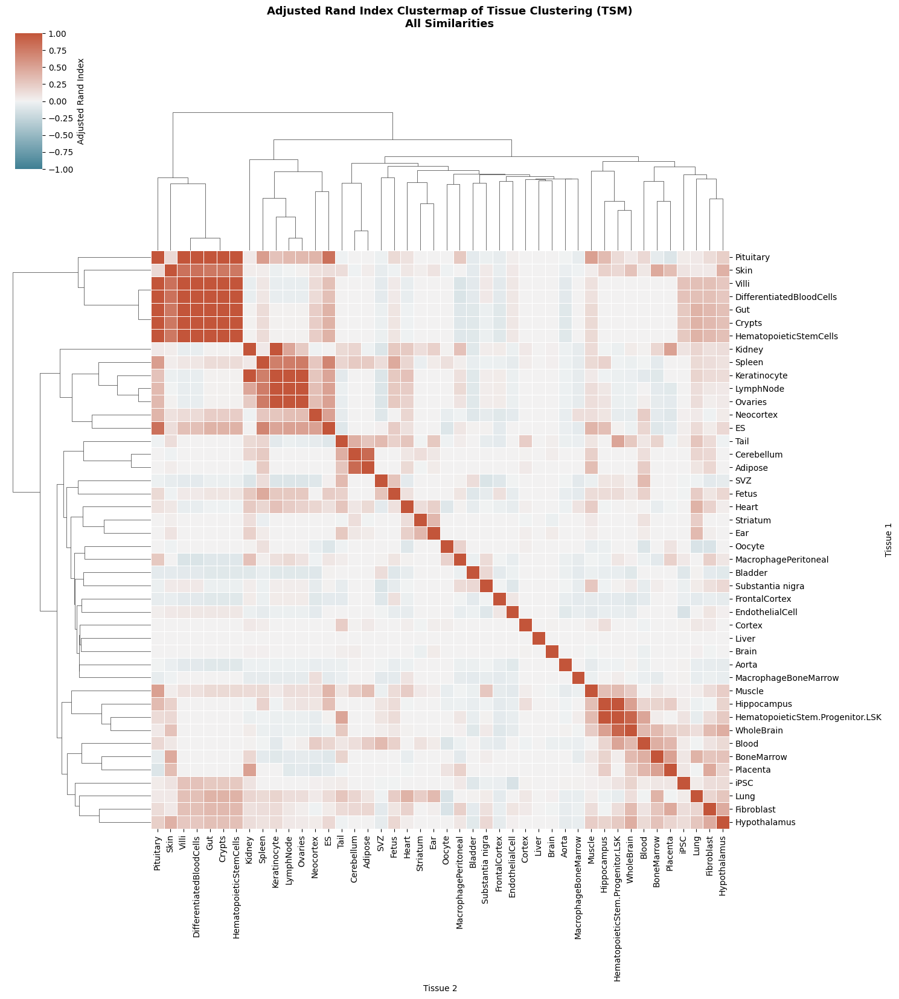

In [61]:
### Clustermap of ALL Similarities grouped by ARIs - TSM

# Create a pivot table for the clustermap
ari_pivot = similarity_results_TSM.pivot(index='Tissue 1', columns='Tissue 2', values='Adjusted Rand Index') # For complete similarity matrix

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_models_TSM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# Ensure x and y axis have the tissues in the same order
tissue_order = best_models_TSM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=-1, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (TSM)\nAll Similarities', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()


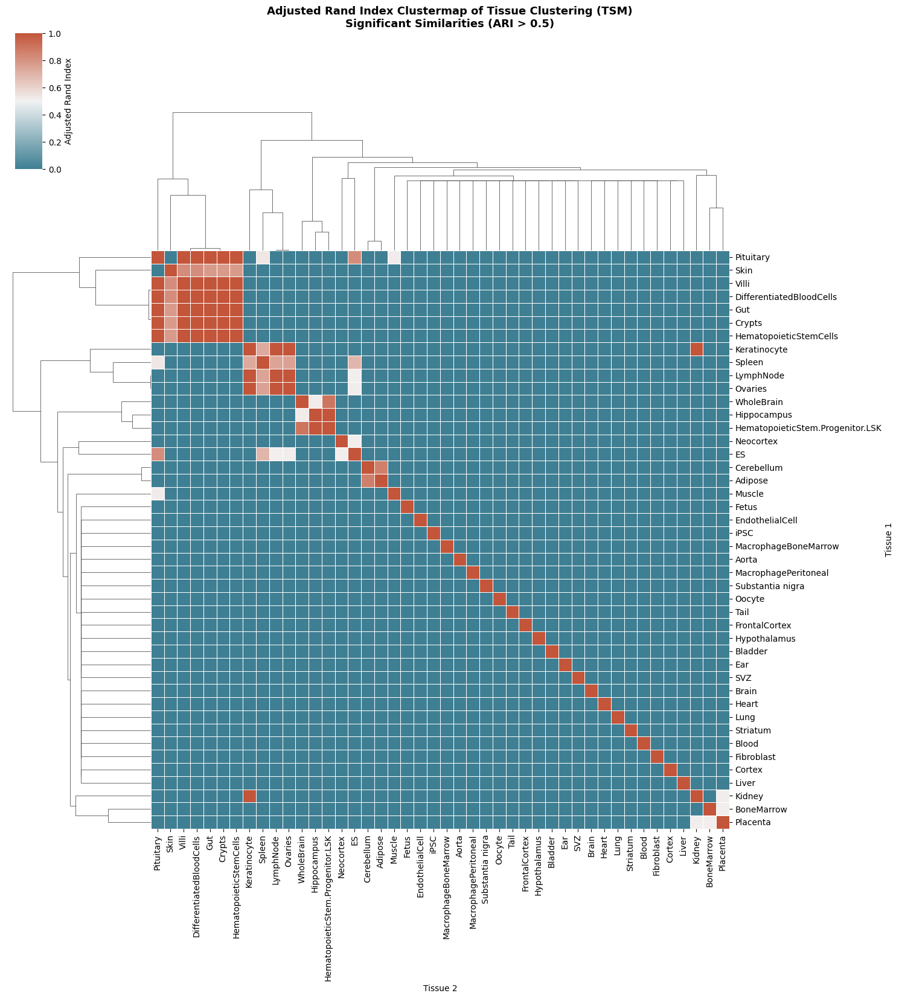

In [62]:
### Clustermap of SIGNIFICANT Similarities grouped by ARIs - TSM

# Create a pivot table for the clustermap
ari_pivot = ari_significant_similarities_TSM.pivot(index='Tissue 1', columns='Tissue 2', values='Adjusted Rand Index') # For significant similarities only

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_models_TSM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# Ensure x and y axis have the tissues in the same order
tissue_order = best_models_TSM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=0, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (TSM)\nSignificant Similarities (ARI > 0.5)', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()


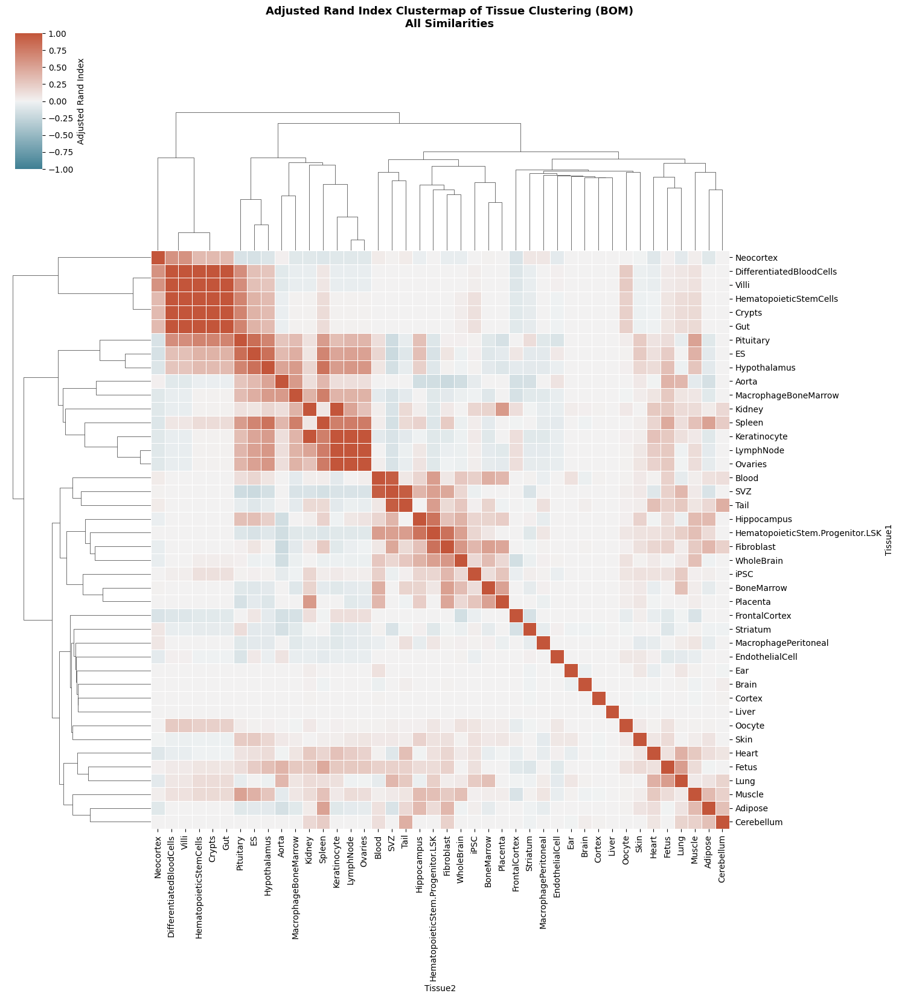

In [63]:
### Clustermap of ALL Similarities grouped by ARIs -BOM

# Create a pivot table for the clustermap
ari_pivot = similarity_results_BOM.pivot(index='Tissue1', columns='Tissue2', values='Adjusted Rand Index') # For all similarities

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_model_BOM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# ensure x and y axis have the tissues in the same order
tissue_order = best_model_BOM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)


# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=-1, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (BOM)\nAll Similarities', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()

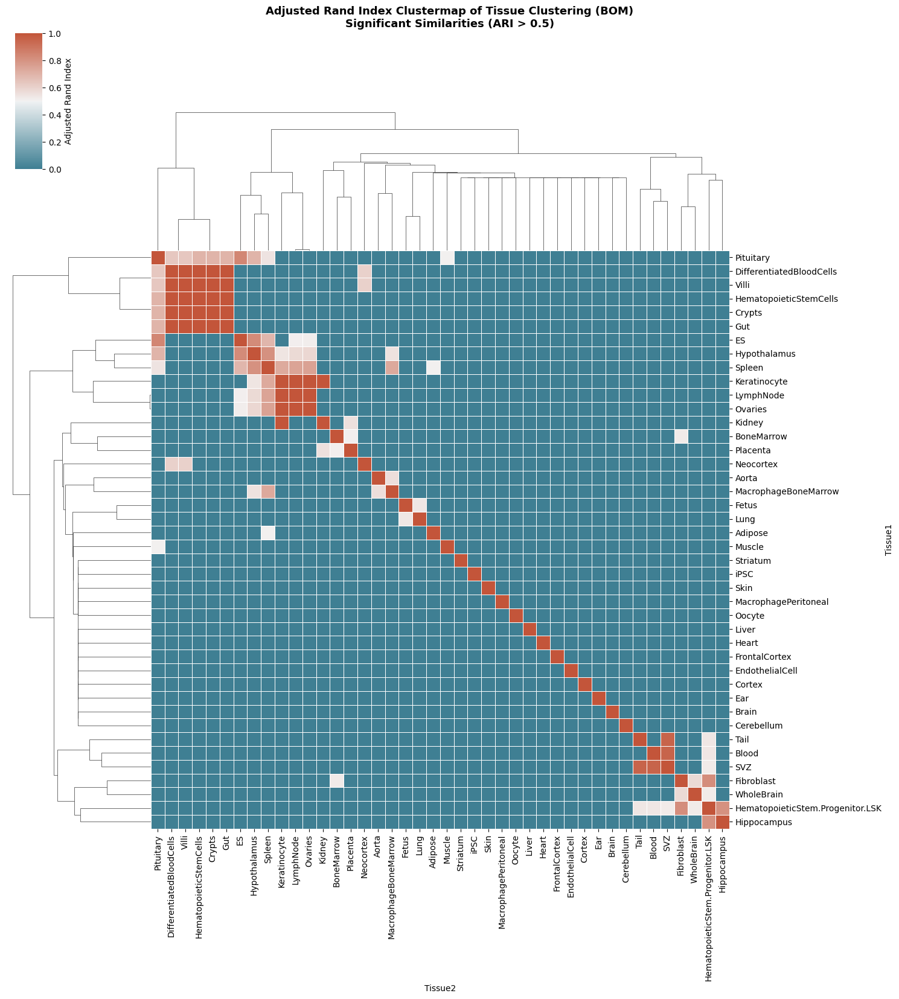

In [64]:
### Clustermap of SIGNIFICANT Similarities grouped by ARIs -BOM

# Create a pivot table for the clustermap
ari_pivot = ari_significant_similarities_BOM.pivot(index='Tissue1', columns='Tissue2', values='Adjusted Rand Index')  # For significant similarities only

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_model_BOM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# ensure x and y axis have the tissues in the same order
tissue_order = best_model_BOM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)


# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=0, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (BOM)\nSignificant Similarities (ARI > 0.5)', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()

### 5.4. Important CpGs across all tissues

In [65]:
#### [Deprecated] CpGs relevant in all tissues based on feature scores - Best Overall Method (BOM) [DBSCAN]

# Initialize a list to store feature scores for each tissue
all_feature_scores_BOM = []

# Load feature scores for each tissue
for tissue_name in best_model_BOM['Tissue']:
    # Load the feature scores for the current tissue
    feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock2/DBSCAN/Feature Analysis/{tissue_name}_feature_scores_without_noise_clock2.csv') ### Clock
    feature_scores = pd.read_csv(feature_scores_path)
    
    # Add the tissue name to the feature scores
    feature_scores['Tissue'] = tissue_name
    
    # Append the feature scores to the list
    all_feature_scores_BOM.append(feature_scores)

# Concatenate feature scores into a single DataFrame
combined_feature_scores_BOM = pd.concat(all_feature_scores_BOM)

# Specify the score column to use
score_column_BOM = 'F_Score'

# Identify CpGs relevant in all tissues based on a threshold_BOM (e.g., top 10% of scores)
percentage = 0.99
threshold_BOM = combined_feature_scores_BOM[score_column_BOM].quantile(percentage)
relevant_cpgs_BOM = combined_feature_scores_BOM[combined_feature_scores_BOM[score_column_BOM] >= threshold_BOM]['CpG']

relevant_cpgs_BOM = relevant_cpgs_BOM.unique()

print(f"Relevant CpGs in all tissues based on {score_column_BOM}: {relevant_cpgs_BOM.tolist()}")

Relevant CpGs in all tissues based on F_Score: ['cg27228973', 'cg23088328', 'cg08030321', 'cg17357006', 'cg10183248', 'cg10246778', 'cg00195533', 'cg13761591', 'cg13383038', 'cg20306751', 'cg25139325', 'cg08627730', 'cg08438614', 'cg00258262', 'cg10739250', 'cg17318138', 'cg19361075', 'cg19931377', 'cg17819031', 'cg16542942', 'cg08454381', 'cg05172686', 'cg06392591', 'cg21590845', 'cg16118197', 'cg23646867', 'cg12880090', 'cg01550545', 'cg14136214', 'cg10045881', 'cg15343536', 'cg20705693', 'cg22661680', 'cg12933950', 'cg06333141', 'cg20565386', 'cg16671155', 'cg01998606', 'cg21907062', 'cg20212950', 'cg03683773', 'cg10186512', 'cg20867091', 'cg03668418', 'cg03898602', 'cg08321639', 'cg21102477', 'cg18093751', 'cg14548925', 'cg07299823', 'cg05136138', 'cg14551953', 'cg09750164', 'cg21089733', 'cg25824158', 'cg04706544', 'cg20334331', 'cg09008979', 'cg17116410', 'cg26102159', 'cg14172937', 'cg24653269', 'cg16437032', 'cg02968236', 'cg18094982', 'cg10381180', 'cg09360996', 'cg12813831', 

In [66]:
print(f'Using the best overall model applied to all tissue datasets, the number of relevant CpGs identified based on a threshold of {percentage} was {len(relevant_cpgs_BOM)} out of 335 (Combined: {combined_feature_scores_BOM.shape[0]})')

Using the best overall model applied to all tissue datasets, the number of relevant CpGs identified based on a threshold of 0.99 was 224 out of 335 (Combined: 34272)


In [67]:
#### CpGs relevant in all tissues based on feature scores - Tissue-Specific Models (TSM)

# Initialize a list to store feature scores for each tissue
all_feature_scores_TSM = []

for _, row in best_models_TSM.iterrows():
    tissue_name = row['Tissue']
    best_method = row['Best_Method']
    
    # Set the path based on the best method
    if best_method == 'kmeans':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock2/KM/Feature Analysis/{tissue_name}_feature_scores_clock2.csv') ### Clock
    elif best_method == 'hierarchical':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock2/HC/Feature Analysis/{tissue_name}_feature_scores_clock2.csv') ### Clock
    elif best_method == 'dbscan':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock2/DBSCAN/Feature Analysis/{tissue_name}_feature_scores_without_noise_clock2.csv') ### Clock

    # Load the feature scores for the current tissues
    if feature_scores_path.exists():
        feature_scores = pd.read_csv(feature_scores_path)
        
        # Add the tissue name to the feature scores
        feature_scores['Tissue'] = tissue_name
        
        # Append the feature scores to the list
        all_feature_scores_TSM.append(feature_scores)
    else:
        print(f"File not found: {feature_scores_path}")

# Concatenate feature scores into a single DataFrame
combined_feature_scores_TSM = pd.concat(all_feature_scores_TSM)

# Specify the score column to use
score_column_TSM = 'F_Score'

# Identify CpGs relevant in all tissues based on a threshold (e.g., top 10% of scores)
percentage = 0.99 # Top 1% of scores
threshold_TSM = combined_feature_scores_TSM[score_column_TSM].quantile(percentage) #
relevant_cpgs_TSM = combined_feature_scores_TSM[combined_feature_scores_TSM[score_column_TSM] >= threshold_TSM]['CpG']

relevant_cpgs_TSM = relevant_cpgs_TSM.unique()

print(f"Relevant CpGs in all tissues based on {score_column_TSM}: {relevant_cpgs_TSM.tolist()}")


Relevant CpGs in all tissues based on F_Score: ['cg09008979', 'cg05844937', 'cg26957053', 'cg18894136', 'cg07547549', 'cg21602520', 'cg08438614', 'cg20867091', 'cg08666298', 'cg20100200', 'cg15471501', 'cg26275174', 'cg18304538', 'cg06472065', 'cg26032884', 'cg02864622', 'cg13379618', 'cg24393114', 'cg27300575', 'cg25229850', 'cg06333141', 'cg12761282', 'cg09377007', 'cg12981876', 'cg26869371', 'cg27291552', 'cg07005811', 'cg18814344', 'cg12501063', 'cg06779064', 'cg14903956', 'cg24597392', 'cg05793328', 'cg20483513', 'cg20432508', 'cg05537515', 'cg07423797', 'cg27547112', 'cg14548925', 'cg05136138', 'cg18024395', 'cg05704605', 'cg10183248', 'cg23287176', 'cg25139325', 'cg01337143', 'cg17318138', 'cg17819031', 'cg19931377', 'cg08454381', 'cg06392591', 'cg15343536', 'cg12933950', 'cg20212950', 'cg10186512', 'cg24975211', 'cg26476447', 'cg05916870', 'cg17266282', 'cg25639084', 'cg22943590', 'cg01019040', 'cg20705693', 'cg09817427', 'cg00689383', 'cg06736685', 'cg08402704', 'cg23344477', 

In [68]:
print(f'Using the best tissue specific model applied to respective dataset, the number of relevant CpGs identified based on a threshold of {percentage} was {len(relevant_cpgs_TSM)} out of 335 (Combined: {combined_feature_scores_TSM.shape[0]})')

Using the best tissue specific model applied to respective dataset, the number of relevant CpGs identified based on a threshold of 0.99 was 235 out of 335 (Combined: 35904)


In [69]:
# check if there are any overlapped CpGs
overlapped_cpgs = set(relevant_cpgs_BOM).intersection(relevant_cpgs_TSM)
print(f"Number of overlapped CpGs between BOM and TSM: {len(overlapped_cpgs)}")

Number of overlapped CpGs between BOM and TSM: 191


In [70]:
# Save the relevant CpGs to a file

folder = 'Cluster Analysis/Clustering Results/Clock2/Relevant CpGs'
os.makedirs(folder, exist_ok=True)

relevant_cpgs_file = os.path.join(folder, 'relevant_cpgs_clock2.csv')
pd.DataFrame(relevant_cpgs_TSM).to_csv(relevant_cpgs_file, index=False)

## 6. Clustering of complete dataset with important CpGs only

In [71]:
# ### Filtering the complete methylation datasets for the relevant CpGs

# important_cpgs = overlapped_cpgs.copy()

# # Filter the complete methylation datasets for the relevant CpGs
# complete_methylation_dataset_importantCpGs_filtered = complete_methylation[complete_methylation['CpG'].isin(important_cpgs)]

# # Display the shape of the filtered dataset
# print(f"Shape of the complete methylation dataset after filtering for relevant CpGs: {complete_methylation_dataset_importantCpGs_filtered.shape}")

# # Display the first few rows of the filtered dataset
# complete_methylation_dataset_importantCpGs_filtered.head()

In [72]:
### DBSCAN Clustering of the complete methylation dataset filtered by relevant CpGs - TRANSPOSED

# # Results dataframe
# dbscan_results_importantCpGs = pd.DataFrame(columns=['eps', 'min_samples', 'silhouette_score', 'n_clusters', 'core_samples', 'cluster_labels', 'total_features', 'dataset_shape'])

# # dataset
# complete_methylation_dataset_importantCpGs_filtered_transposed = complete_methylation_dataset_importantCpGs_filtered.set_index('CpG').transpose()

# X = complete_methylation_dataset_importantCpGs_filtered_transposed

# # Function to perform DBSCAN on the complete methylation dataset filtered by relevant CpGs
# @delayed
# def dbscan_clustering_importantCpGs(X, eps, min_samples):
#     results = []

#     try:
#         # Perform DBSCAN with current parameters
#         dbscan = DBSCAN(eps=eps, min_samples=min_samples)
#         dbscan.fit(X)

#         # Check the number of clusters
#         n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

#         # Check the number of core samples
#         core_samples = np.sum(dbscan.labels_ != -1)

#         # Calculate Silhouette Score
#         if n_clusters > 1:
#             silhouette_avg = silhouette_score(X, dbscan.labels_)
#         else:
#             silhouette_avg = -1

#         # Save the results
#         results.append([eps, min_samples, silhouette_avg, n_clusters, core_samples, dbscan.labels_, X.shape[1], X.shape])

#     except ValueError as e:
#         print(f"Error: {e}")
#         pass

#     return results

# # Prepare delayed functions for each parameter combination
# eps_values = range(4,15)  # Based on the elbow plot
# min_samples_values = range(2, 15)

# tasks = [dbscan_clustering_importantCpGs(X, eps, min_samples) for eps in eps_values for min_samples in min_samples_values]

# # Compute the tasks in parallel
# results_list = compute(*tasks)

# # Combine results
# dbscan_results_importantCpGs_list = [item for sublist in results_list for item in sublist]

# # Convert results list to a DataFrame
# dbscan_results_importantCpGs_df = pd.DataFrame(dbscan_results_importantCpGs_list, columns=['eps', 'min_samples', 'silhouette_score', 'n_clusters', 'core_samples', 'cluster_labels', 'total_features', 'dataset_shape'])

# # Sort results by silhouette score
# dbscan_results_importantCpGs = dbscan_results_importantCpGs_df.sort_values(by='silhouette_score', ascending=False)

# # Display the results
# dbscan_results_importantCpGs.head()

In [73]:
# ### Scatter plot of DBSCAN clustering of the complete methylation dataset filtered by relevant CpGs - With PCA

# # Get the best results
# best_eps = dbscan_results_importantCpGs['eps'].values[0]
# best_min_samples = dbscan_results_importantCpGs['min_samples'].values[0]
# best_labels = dbscan_results_importantCpGs['cluster_labels'].values[0]

# # Apply PCA to reduce to 2 dimensions
# pca = PCA(n_components=2)

# # Transpose the dataset so that CpGs are columns and samples are rows
# X = complete_methylation_dataset_importantCpGs_filtered_transposed
# X = sc.fit_transform(X)
# X_pca = pca.fit_transform(X)

# # Plot the data
# plt.figure(figsize=(8, 6))
# plt.scatter(X_pca[:, 0], X_pca[:, 1], c=best_labels, cmap='viridis')
# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title(f'Complete Methylation Dataset Filtered by Relevant CpGs\nDBSCAN Clustering (eps={best_eps}, min_samples={best_min_samples})')
# plt.grid()
# plt.colorbar(label='Cluster Label')
# plt.show()
